# Waldemar Chang - Assignment 5: Constructing the Rectification and Interface Services
## EN.705.603.82.FA24 Creating AI-Enabled Systems
### Task 4
#### In a notebook called notebooks/augmentation_analysis.ipynb, select ten images from the TechTrack Dataset, visualize the transformations, and analyze the impacts of your augmentation on the model's performance.

In [1]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from nms import filter
from object_detection import Model, draw_bboxes
from augmentation import horizontal_flip, gaussian_blur, resize, rotate, color_jitter, random_crop
from helper import calculate_iou, calculate_pr, calculate_ap, calculate_map, calculate_11pi, calculate_precision_recall_f1, calculate_specificity, get_ground_truth

In [2]:
# Define path to folder containing images and labels
#folder_path = r"C:\Users\walde\techtrack\notebooks\logistics"
folder_path = r"/teamspace/studios/this_studio/logistics"

# Initialize models
model1 = Model('model1.cfg', 'model1.weights')
model2 = Model('model2.cfg', 'model2.weights')

# Get all image file names
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]

Output layer names: ('yolo_30', 'yolo_37')
Output layer names: ('yolo_30', 'yolo_37')


In [3]:
# Sort the image files and select the first 10 images
image_files.sort()
sampled_images = image_files[:10]

# Get list of class IDs
num_classes = 20
class_ids_list = list(range(num_classes))
class_labels = ['barcode', 'car', 'cardboard box', 'fire', 'forklift', 'freight container', 'gloves',
                'helmet', 'ladder', 'license plate', 'person', 'qr code', 'road sign', 'safety vest',
                'smoke', 'traffic cone', 'traffic light', 'truck', 'van', 'wood pallet']

# Define augmentations
augmentations = [
    ("Horizontal Flip", horizontal_flip),
    ("Gaussian Blur", lambda img: gaussian_blur(img, kernel_size=(5, 5), sigma=1)),
    ("Resize", lambda img: resize(img, (300, 300))),
    ("Rotate 45 degrees", lambda img: rotate(img, 45)),
    ("Color Jitter", lambda img: color_jitter(img, brightness=0.2, contrast=0.2, saturation=0.2)),
    ("Random Crop", lambda img: random_crop(img, (200, 200)))
]

# Initialize performance metrics for augmented images
aps_augmented_model1 = {aug_name: [] for aug_name, _ in augmentations}
aps_augmented_model2 = {aug_name: [] for aug_name, _ in augmentations}

Inference time elapsed: 0.09 seconds
Inference time elapsed: 0.09 seconds


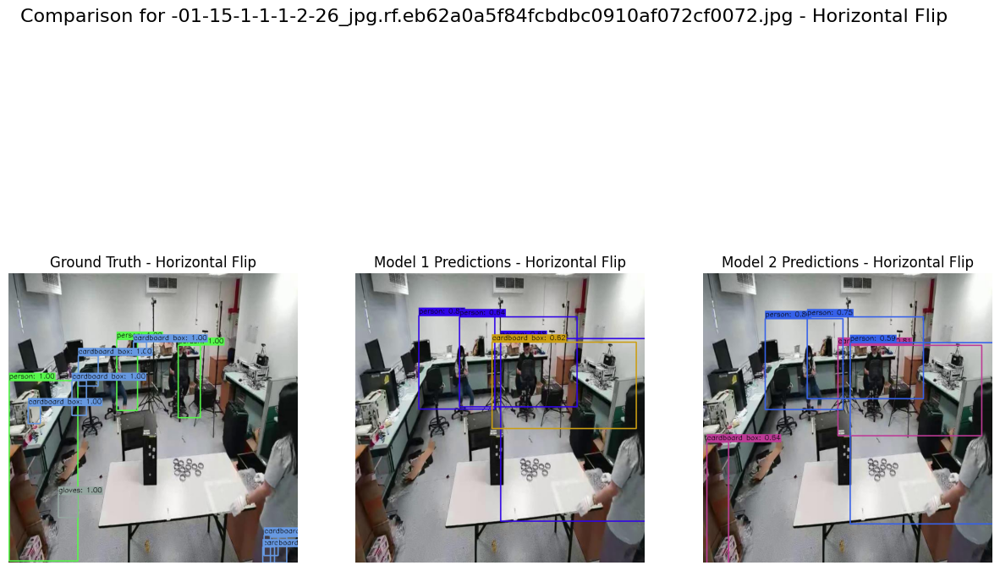

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


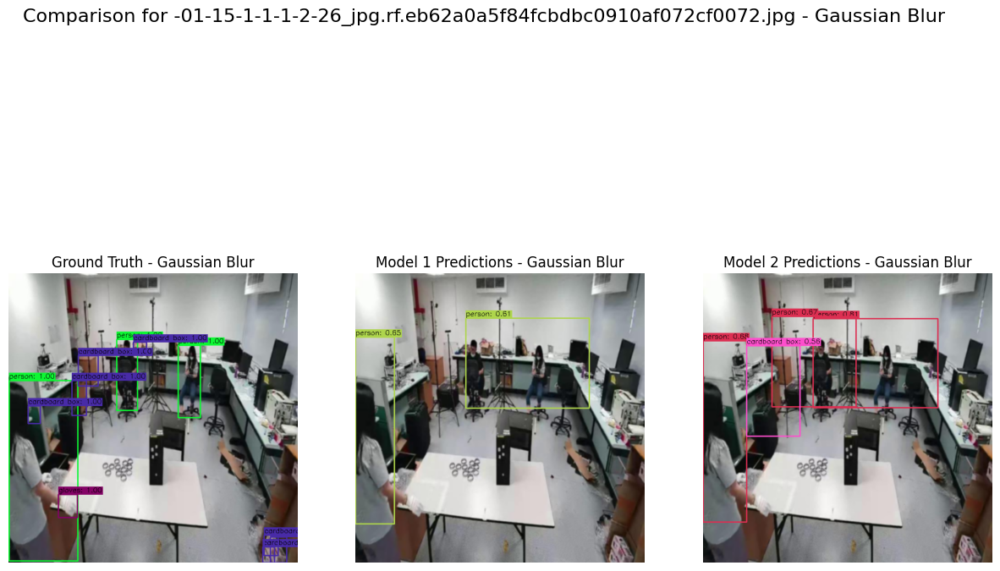

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


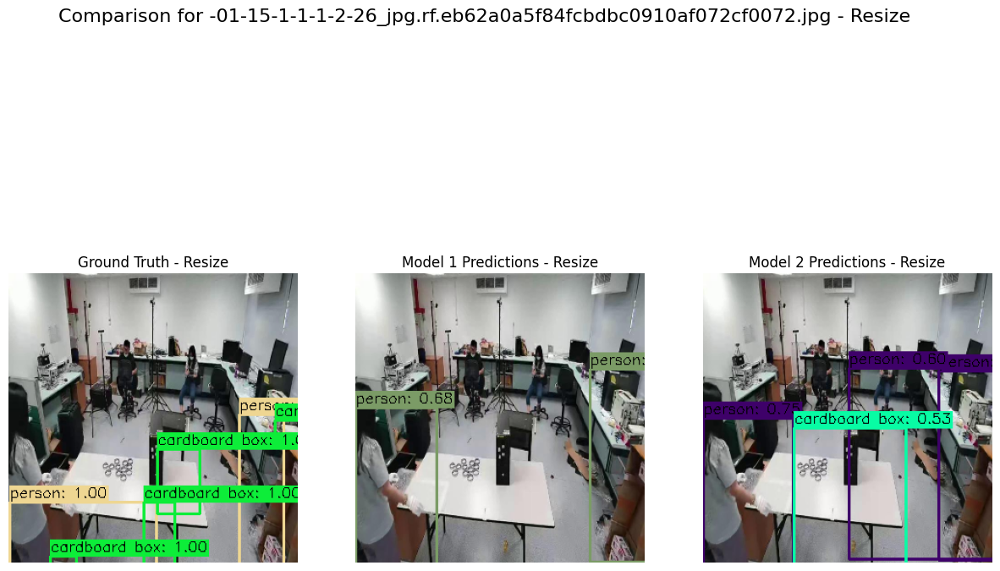

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


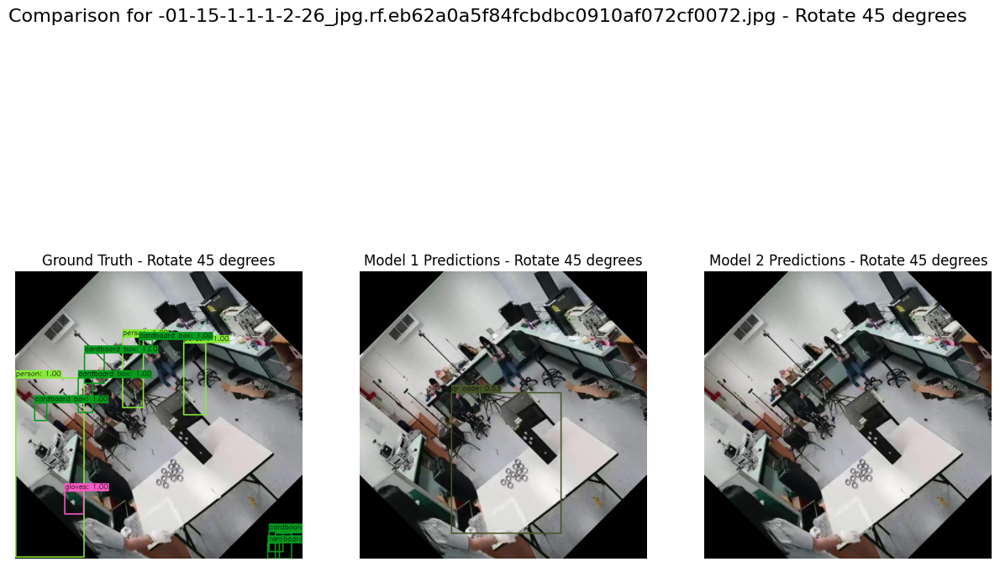

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


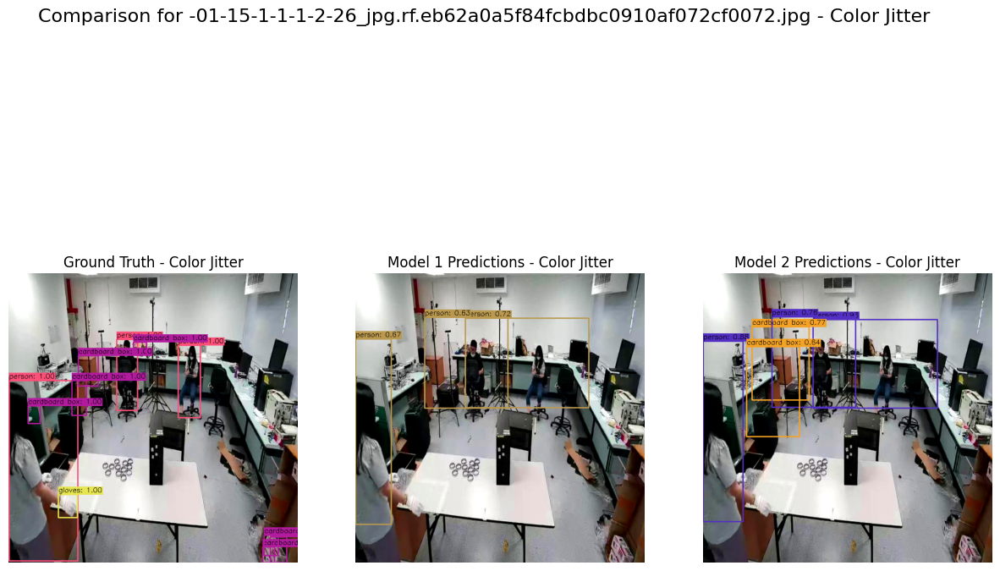

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


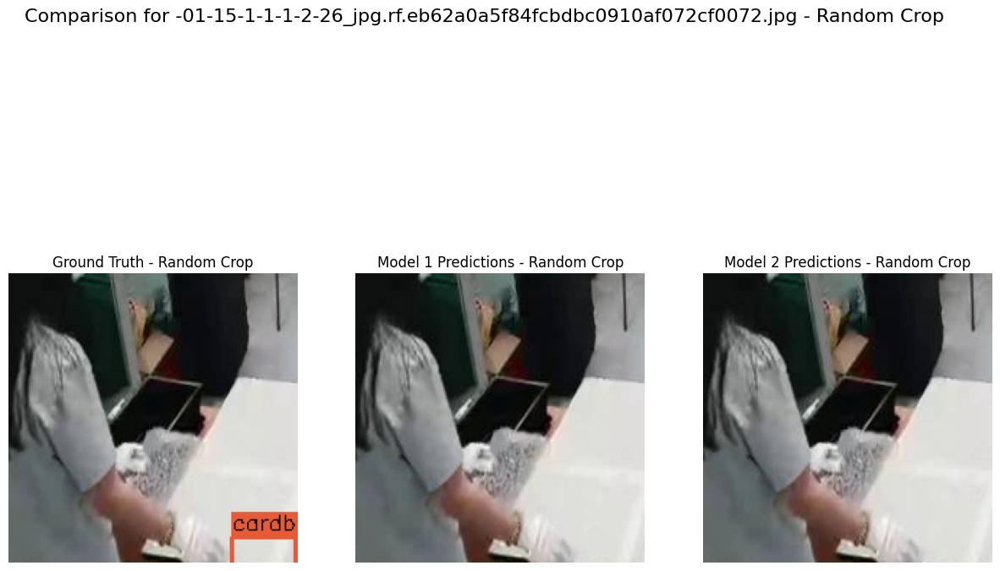

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


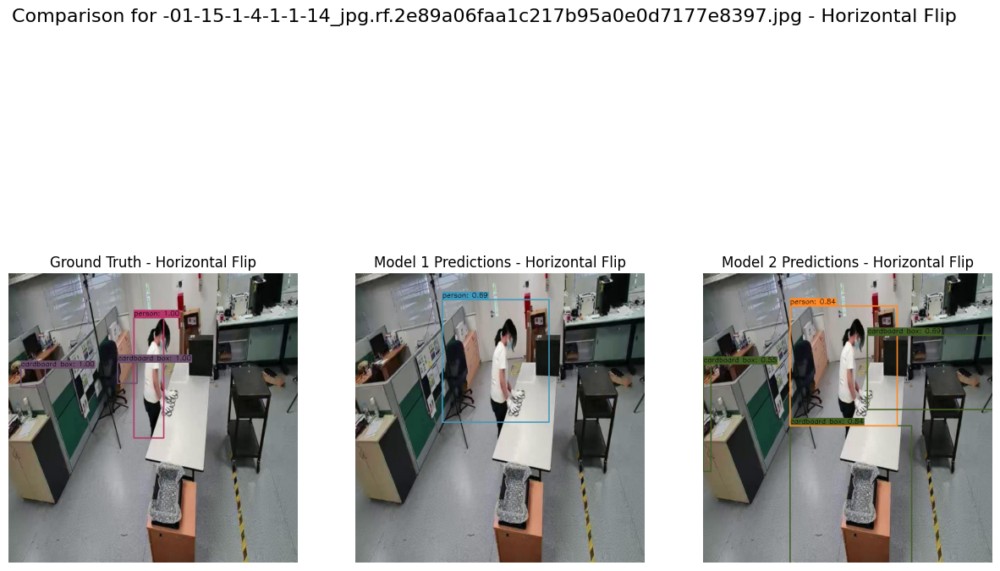

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


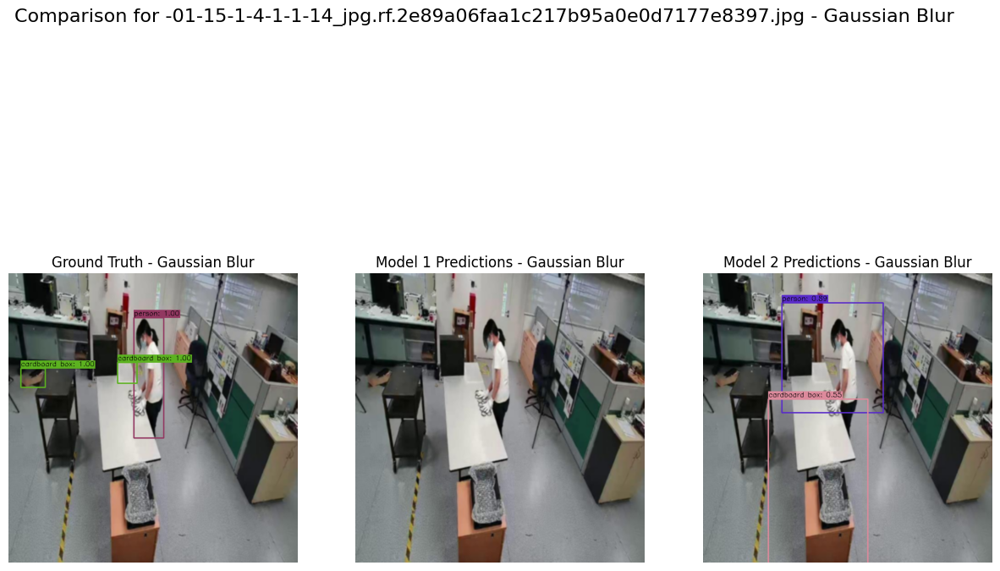

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


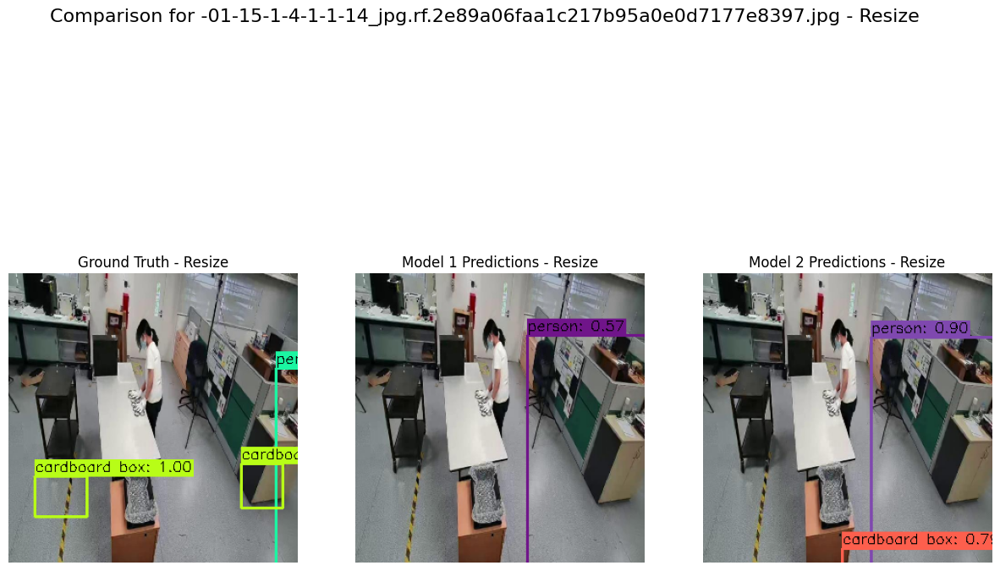

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


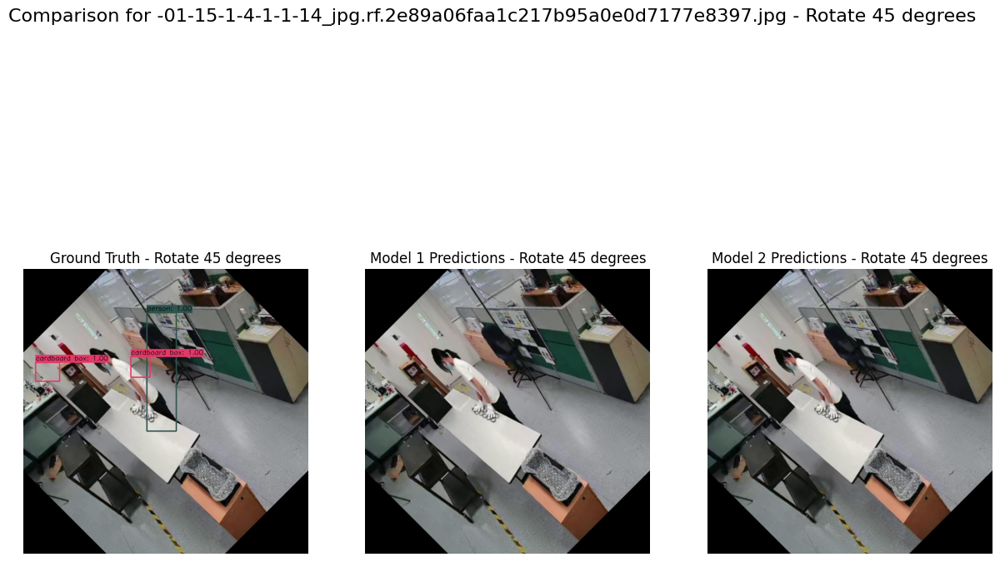

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


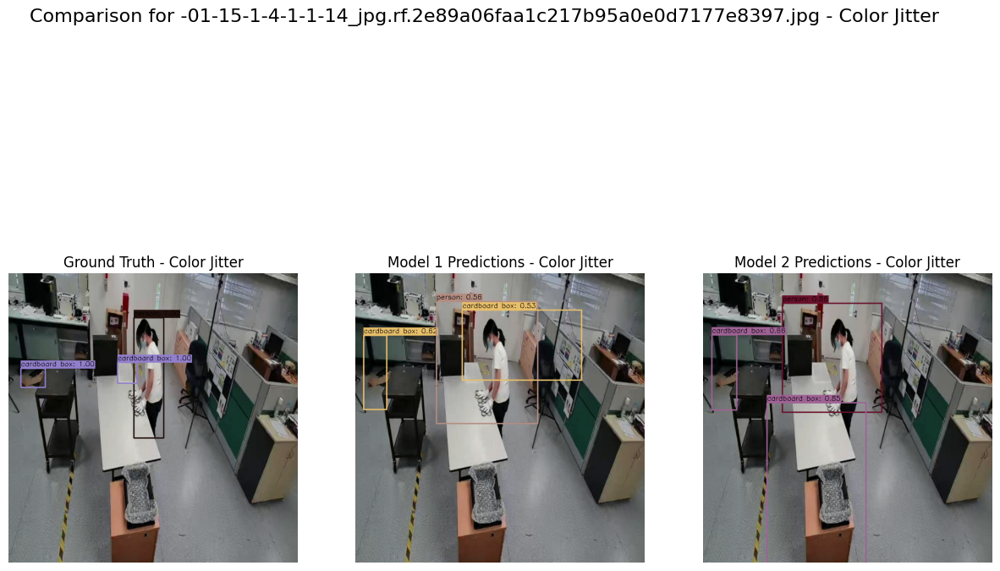

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


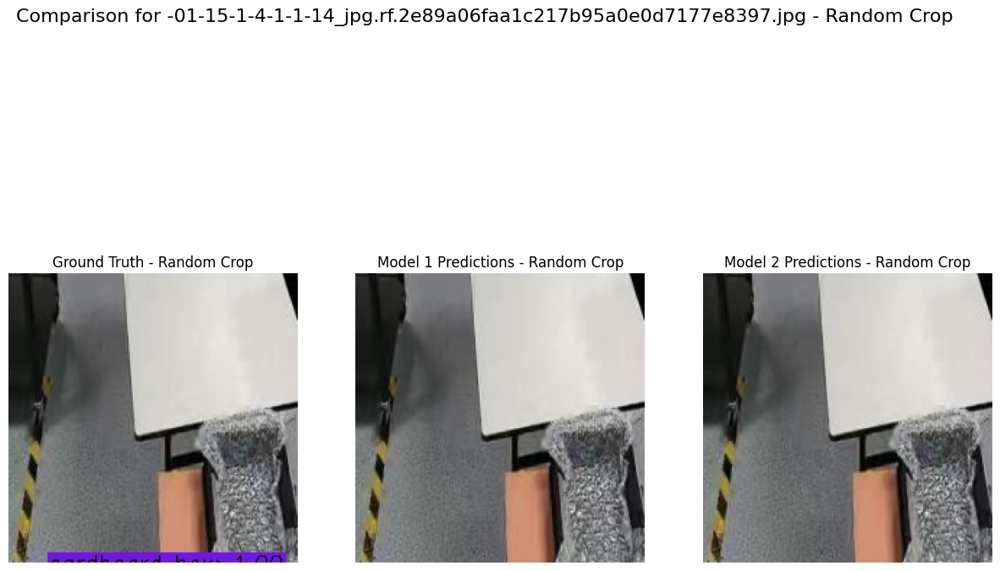

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


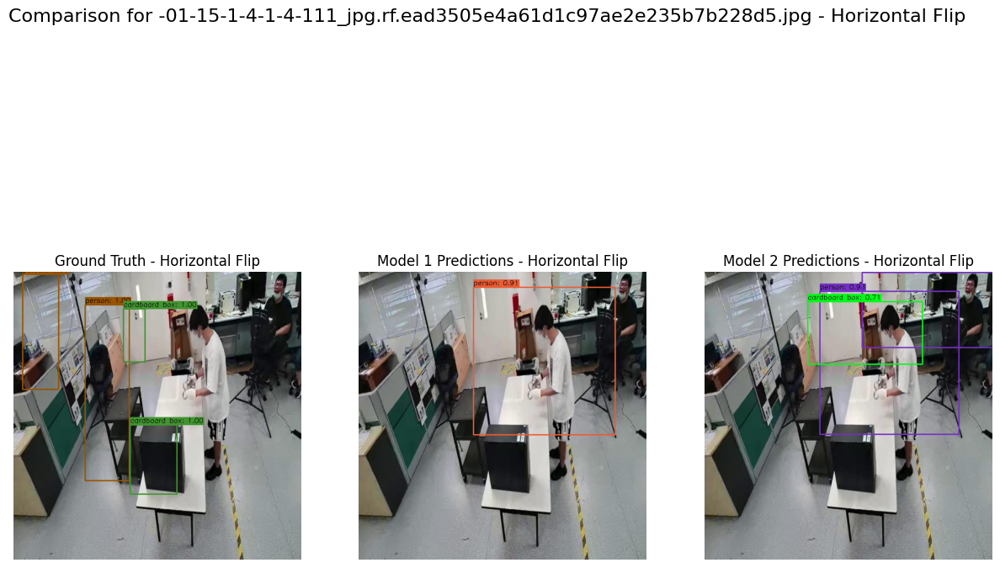

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


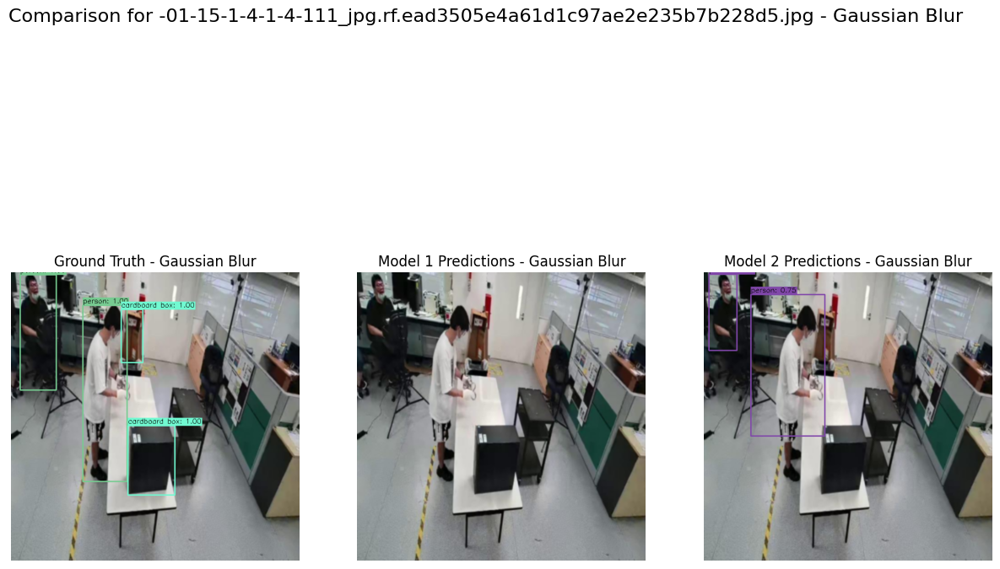

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


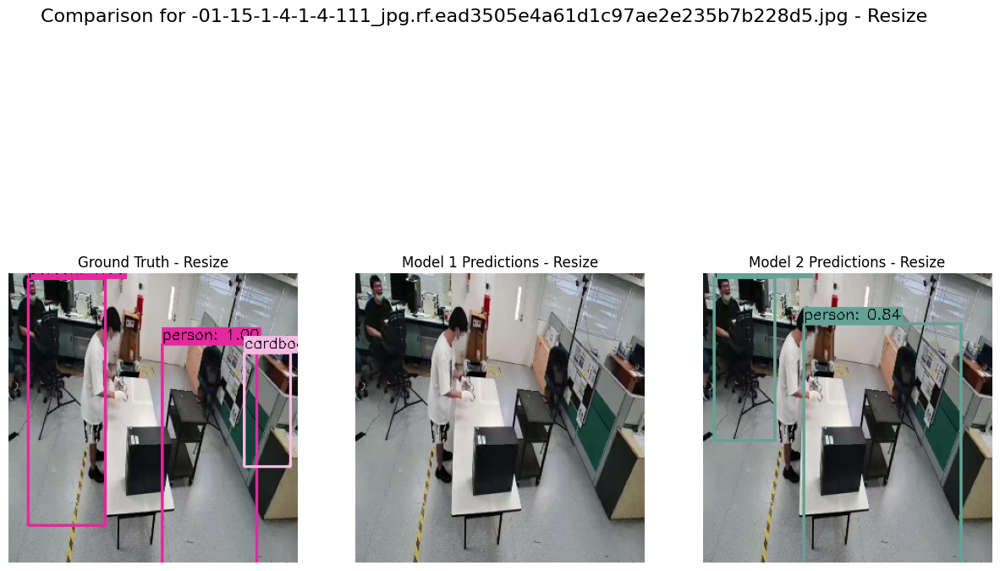

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


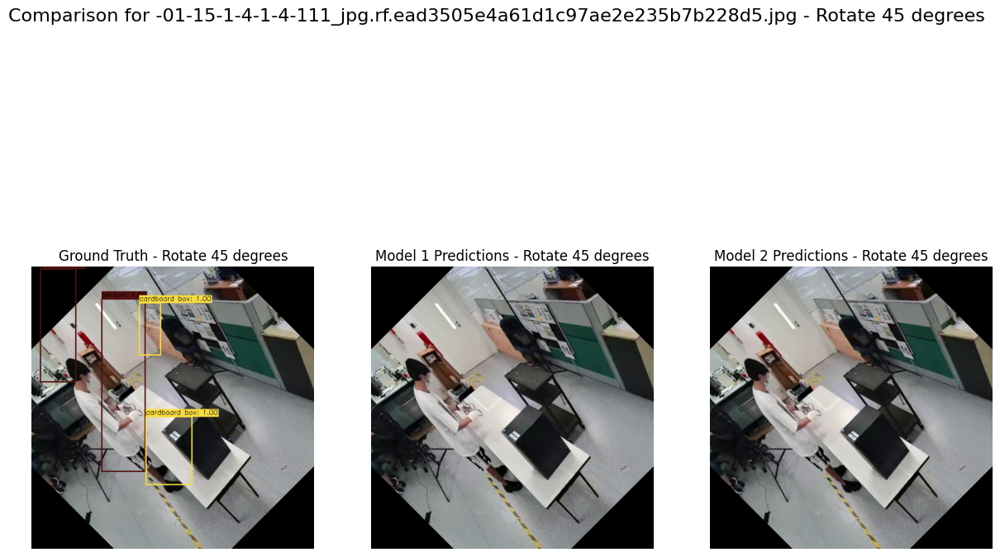

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


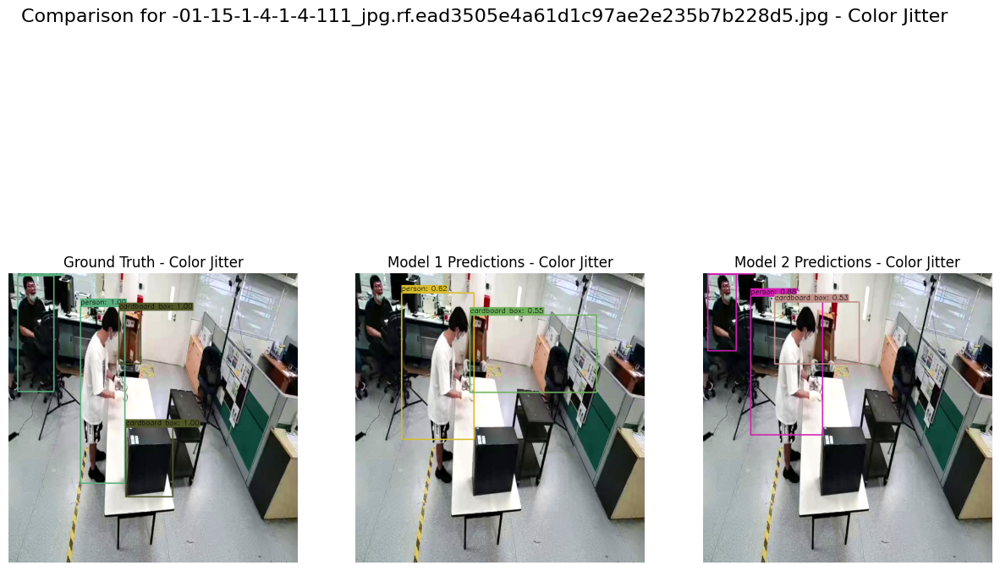

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


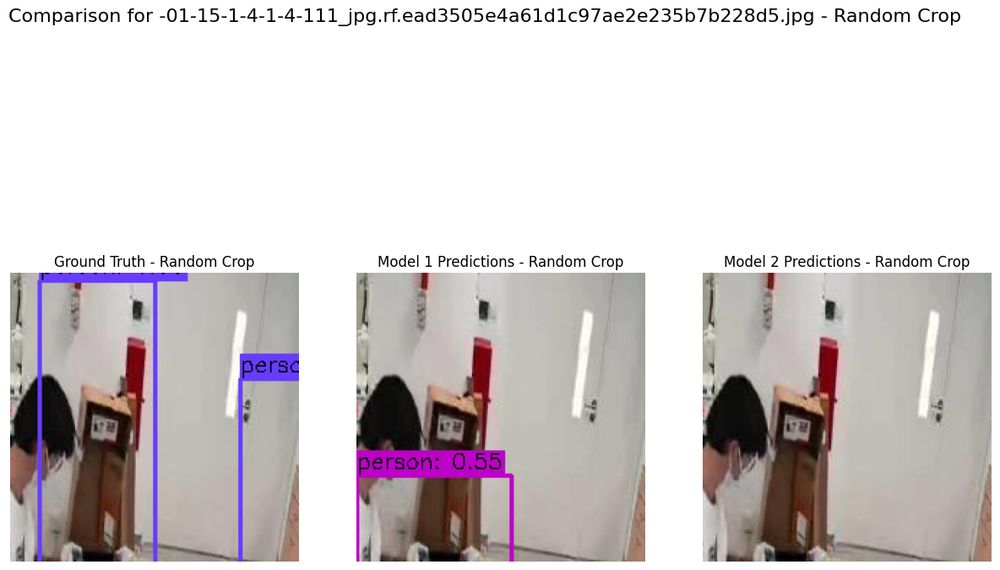

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


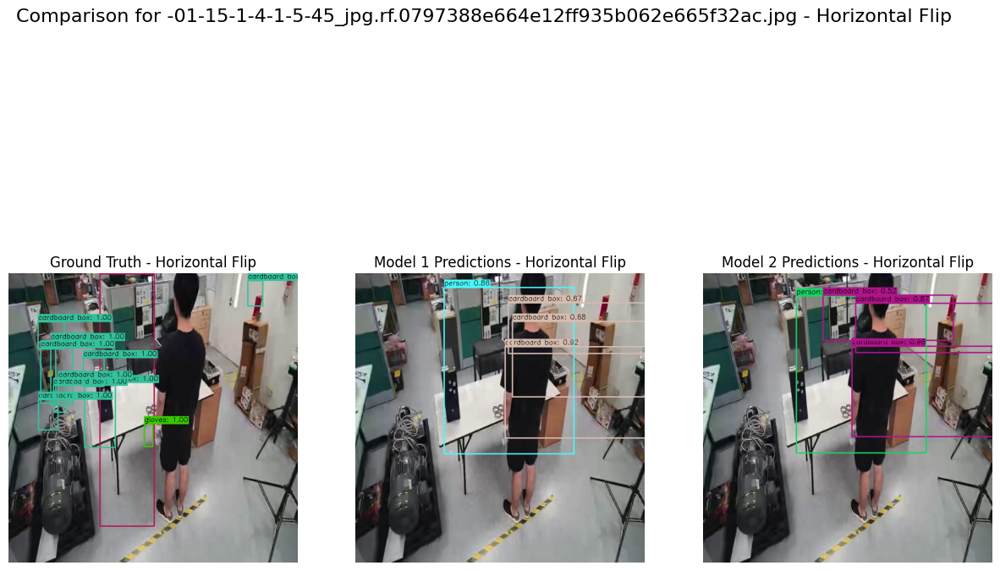

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


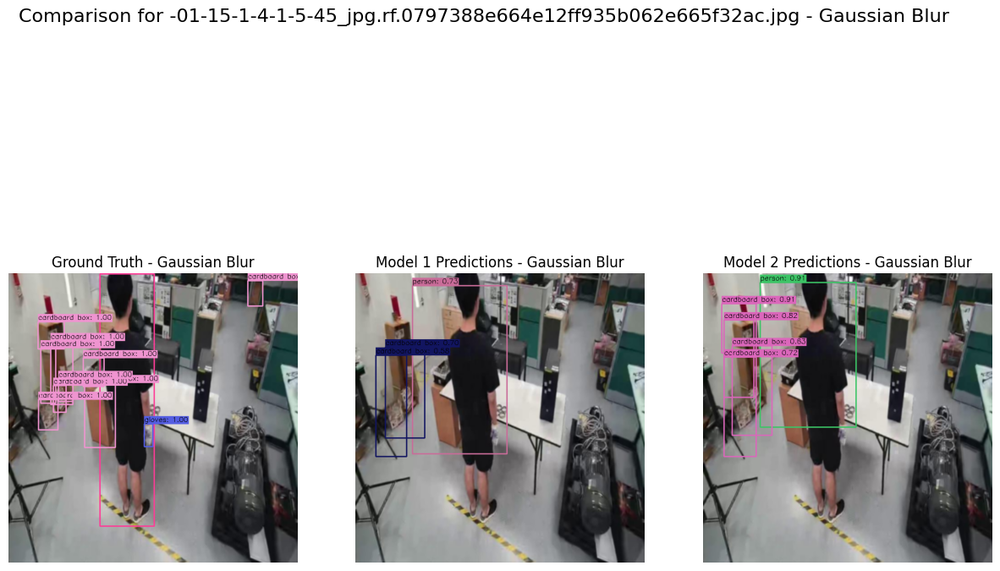

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


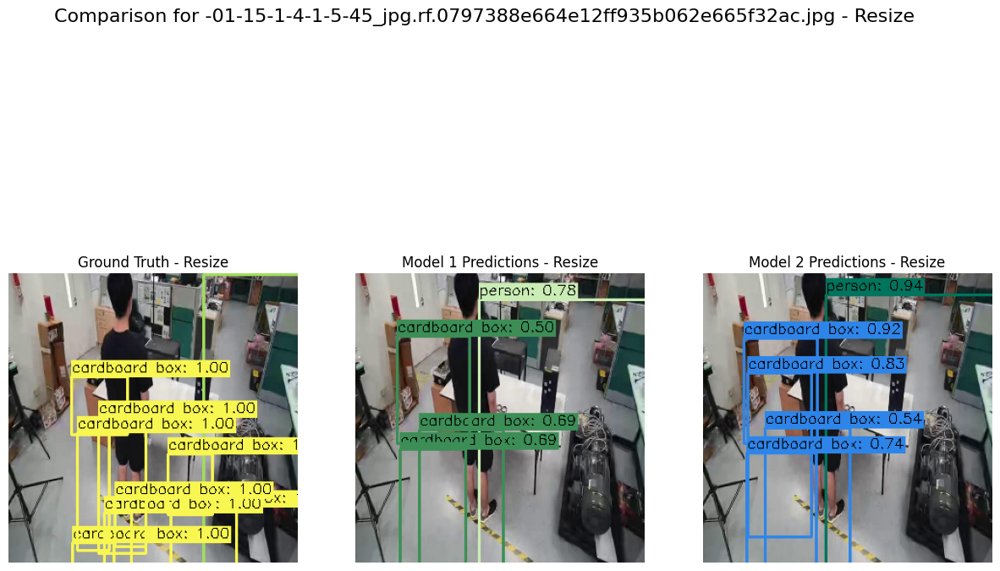

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


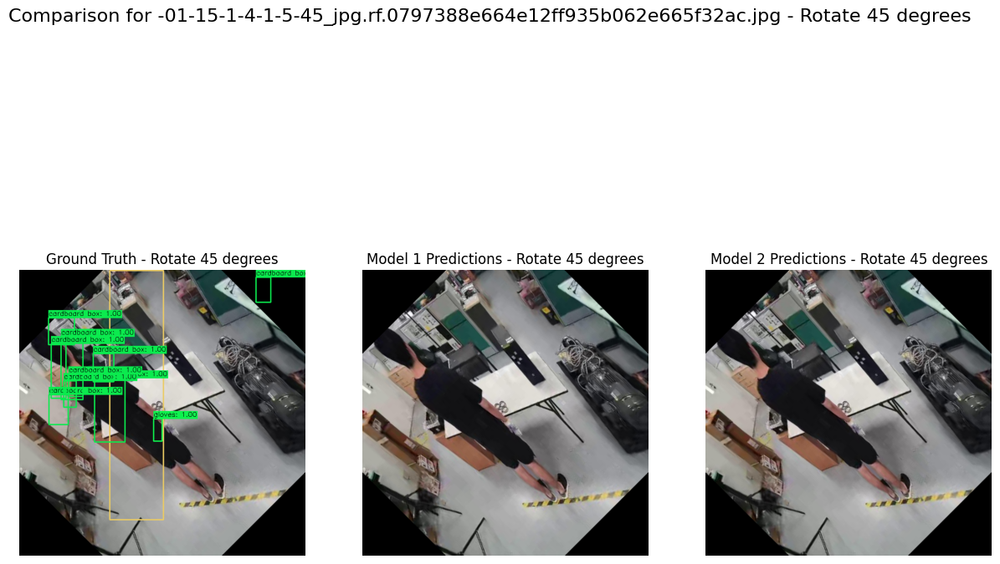

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


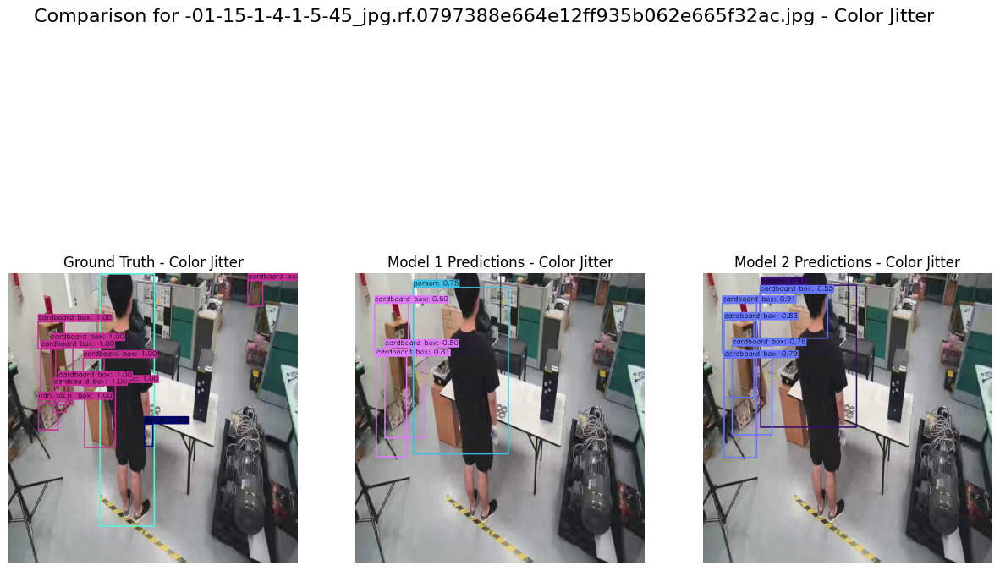

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


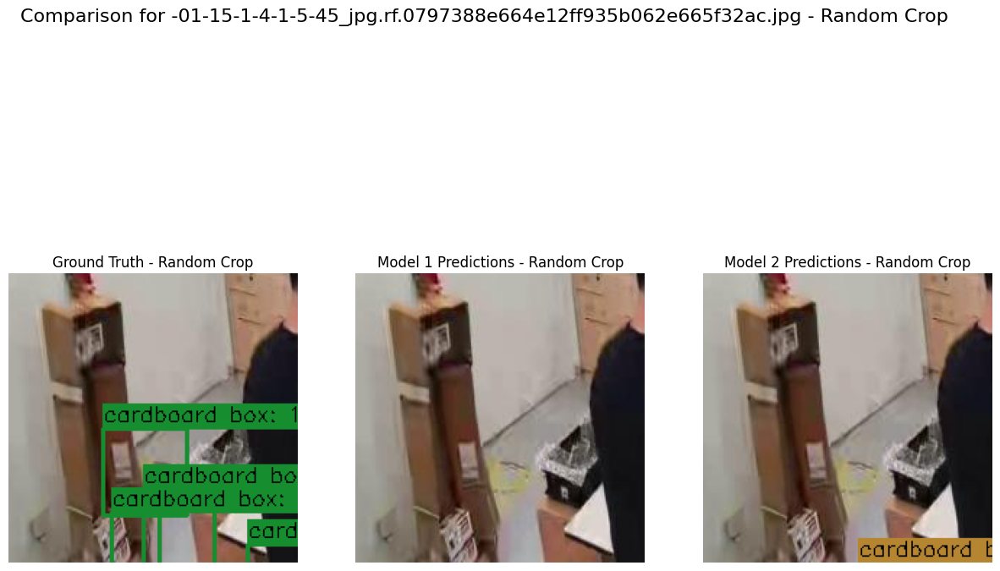

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


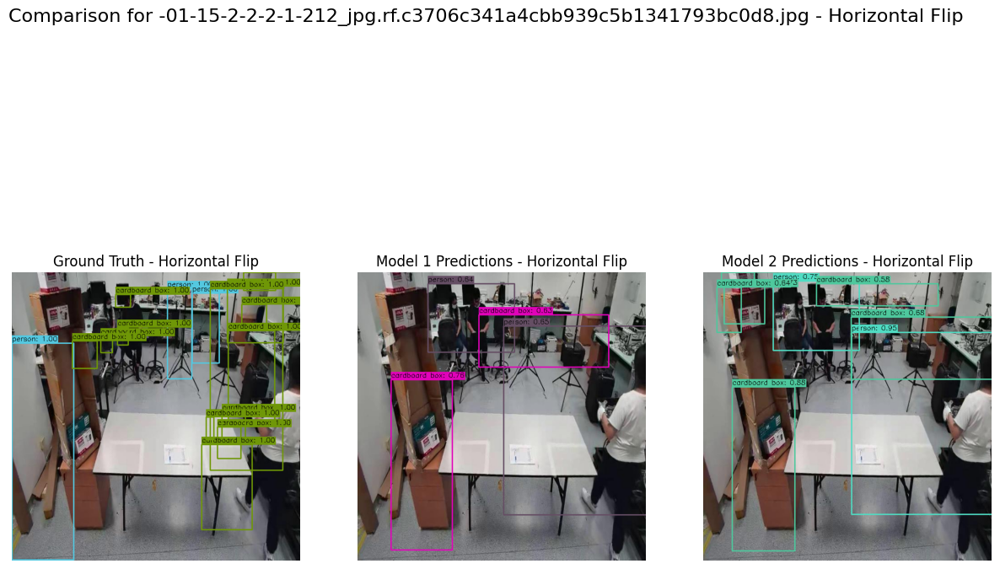

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


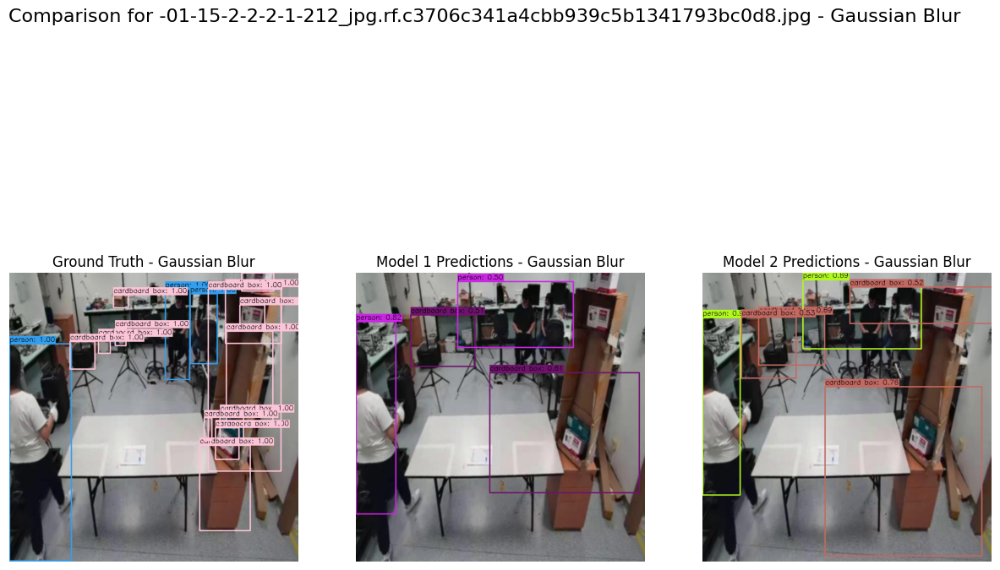

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


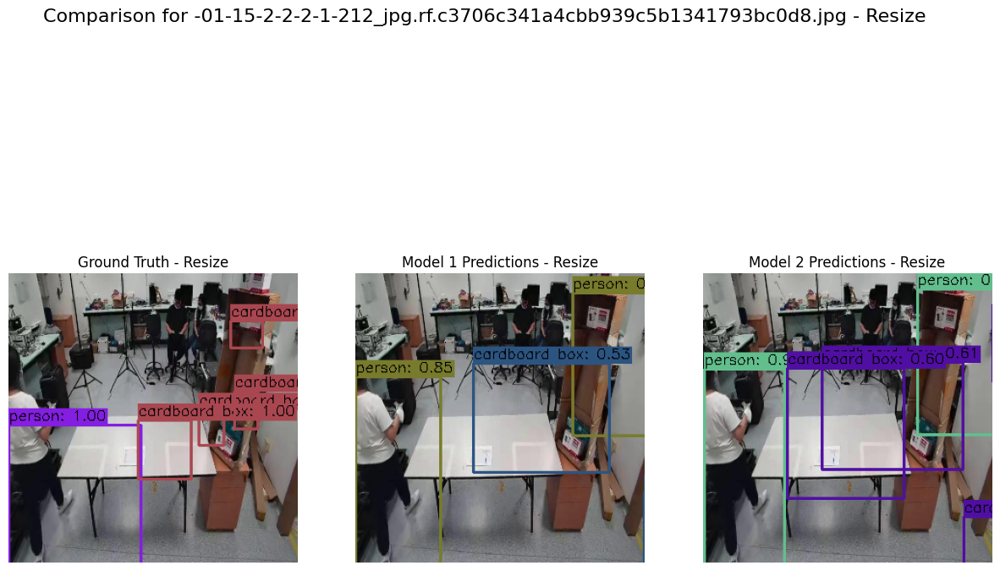

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


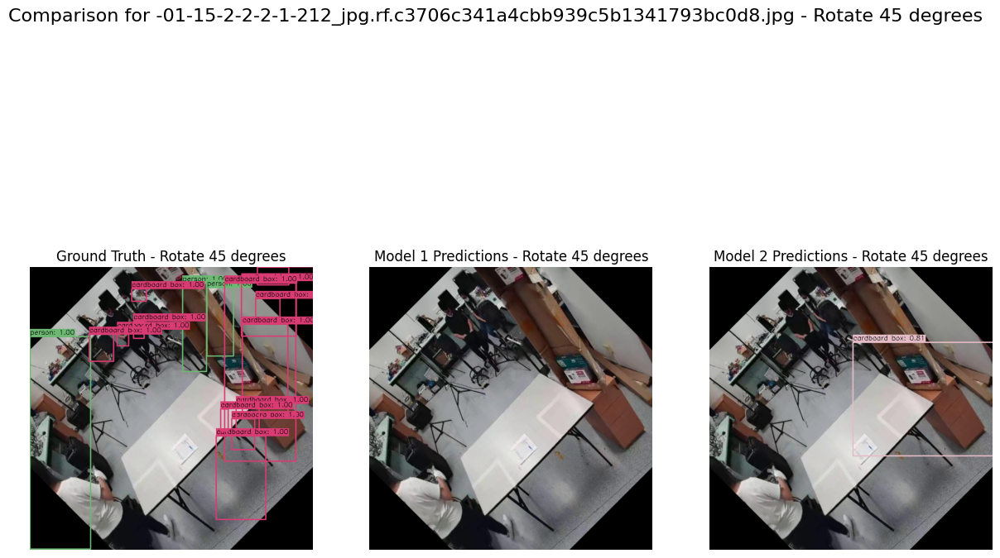

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


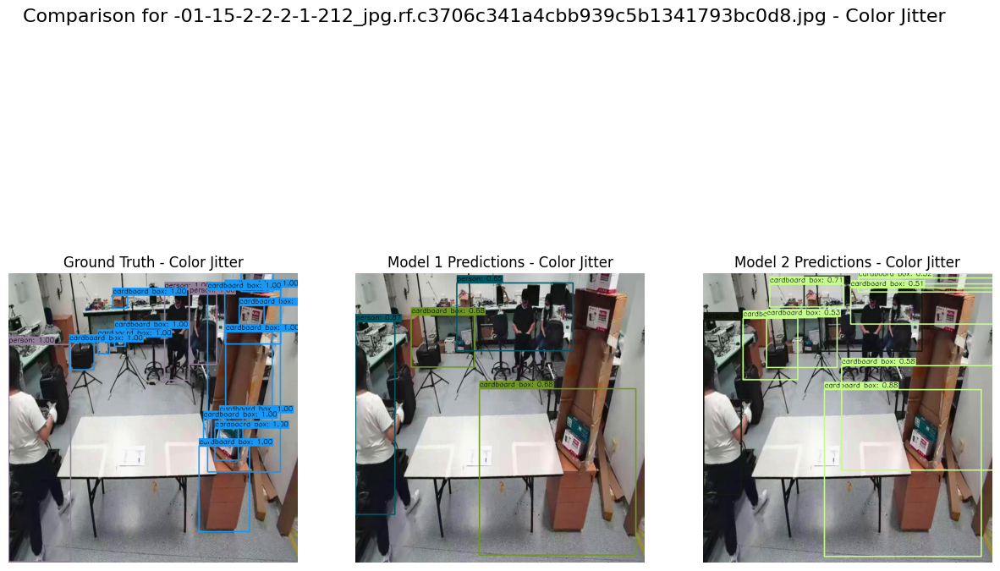

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


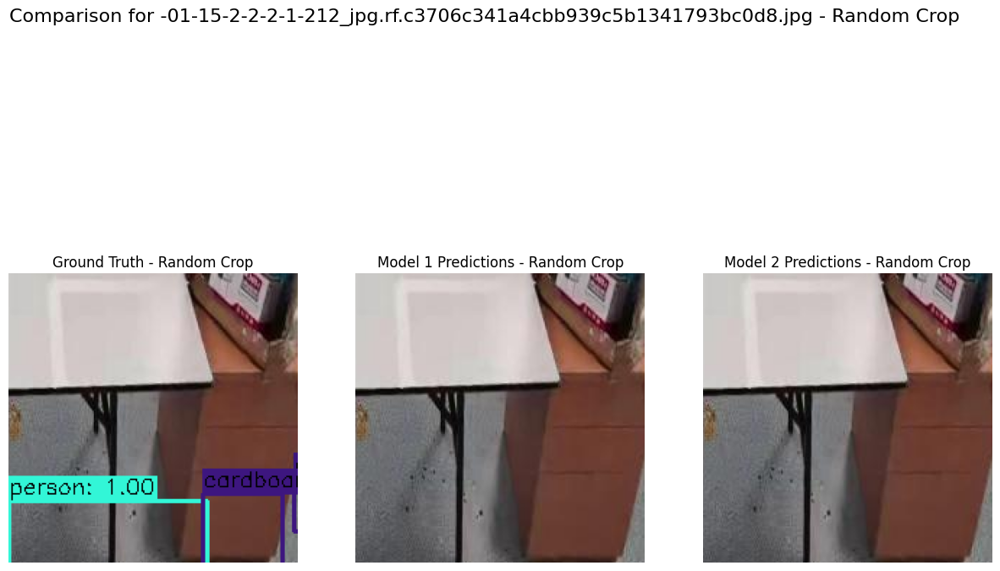

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


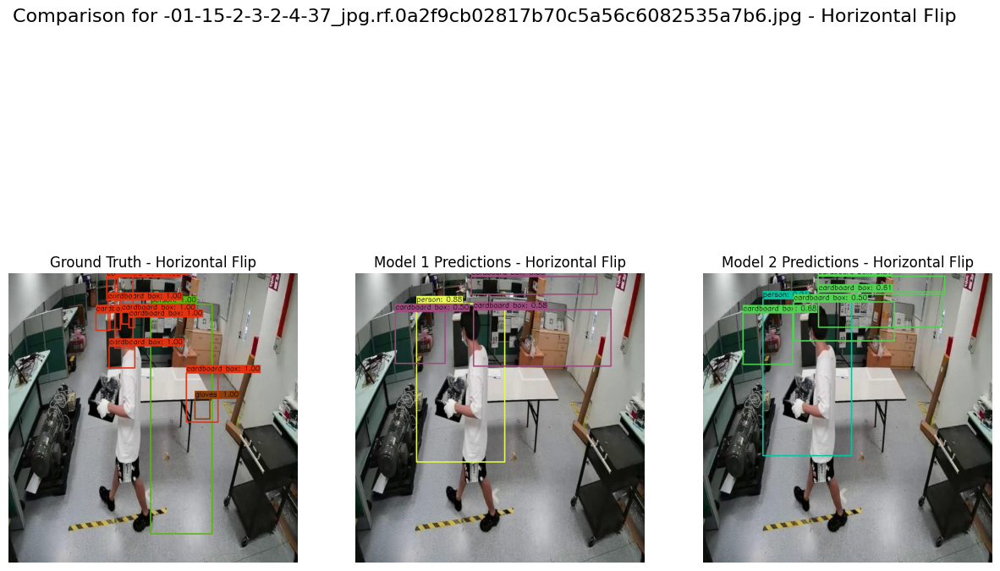

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


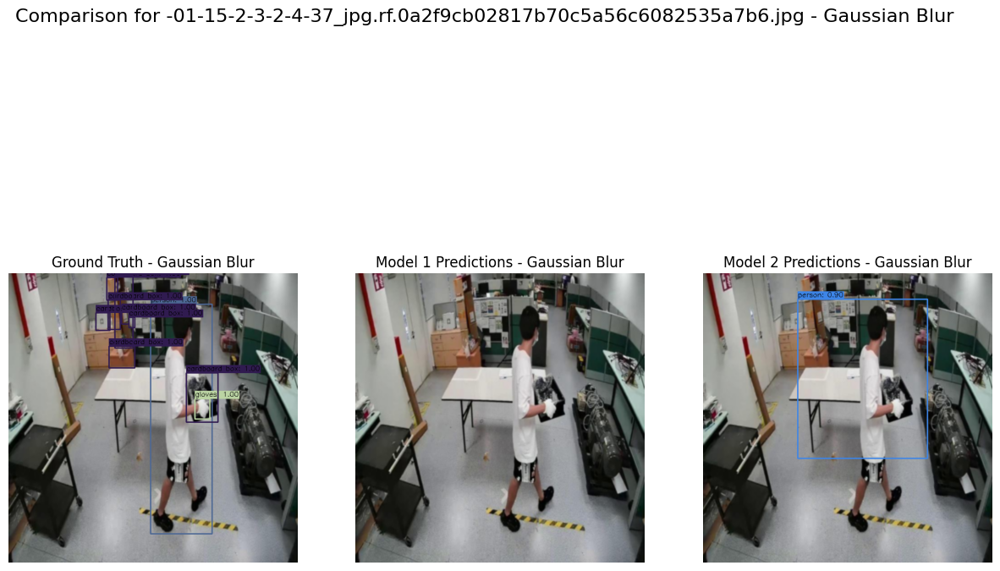

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


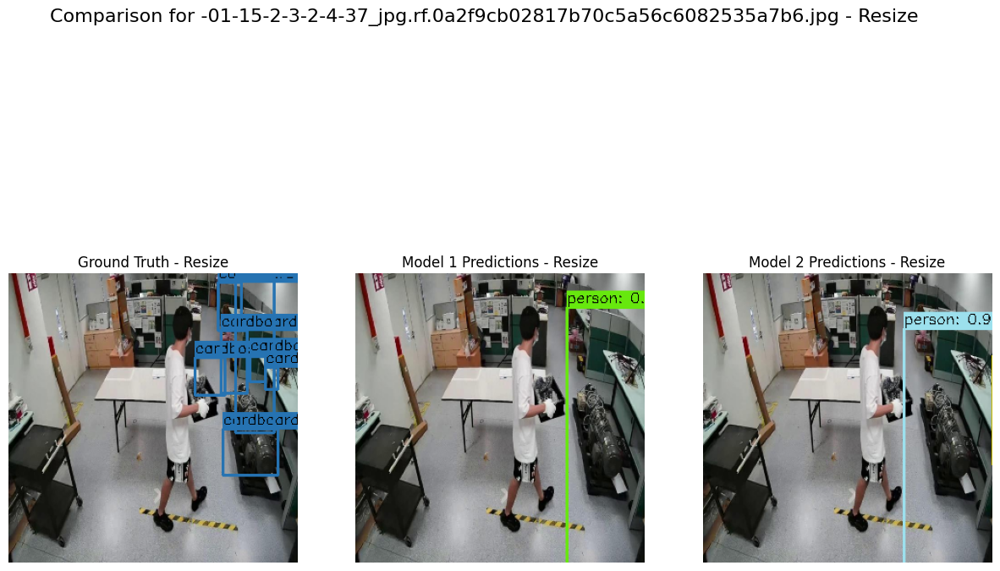

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


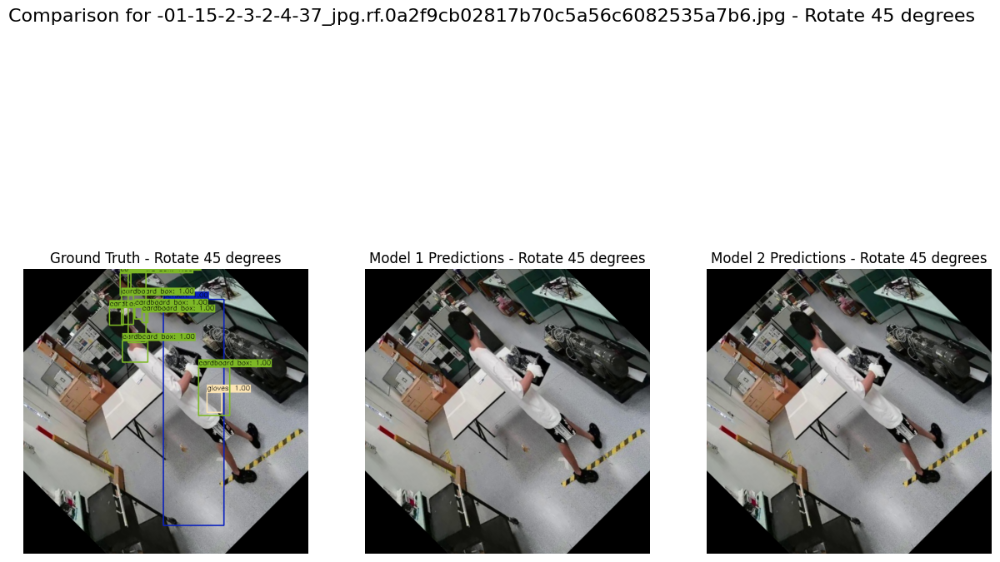

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


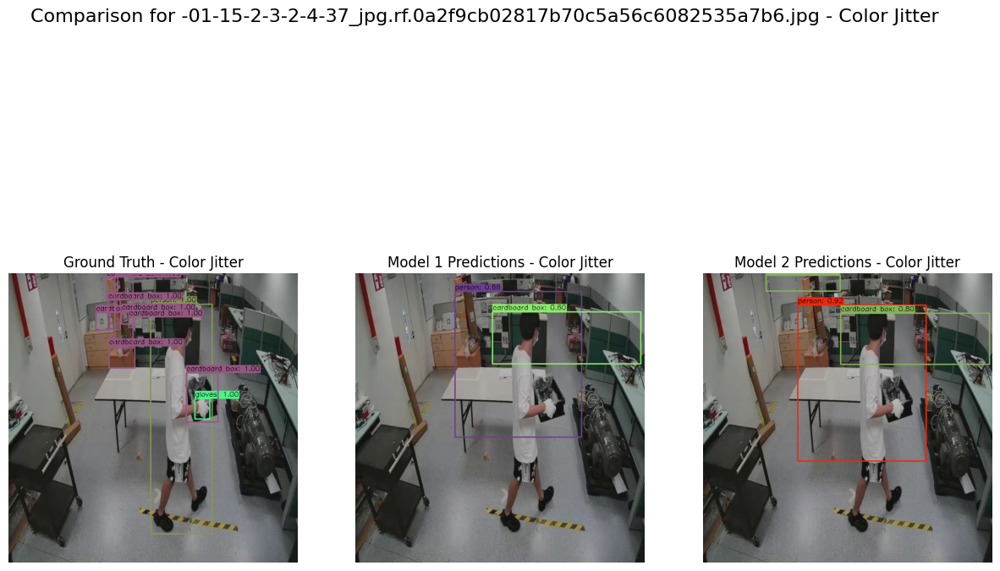

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


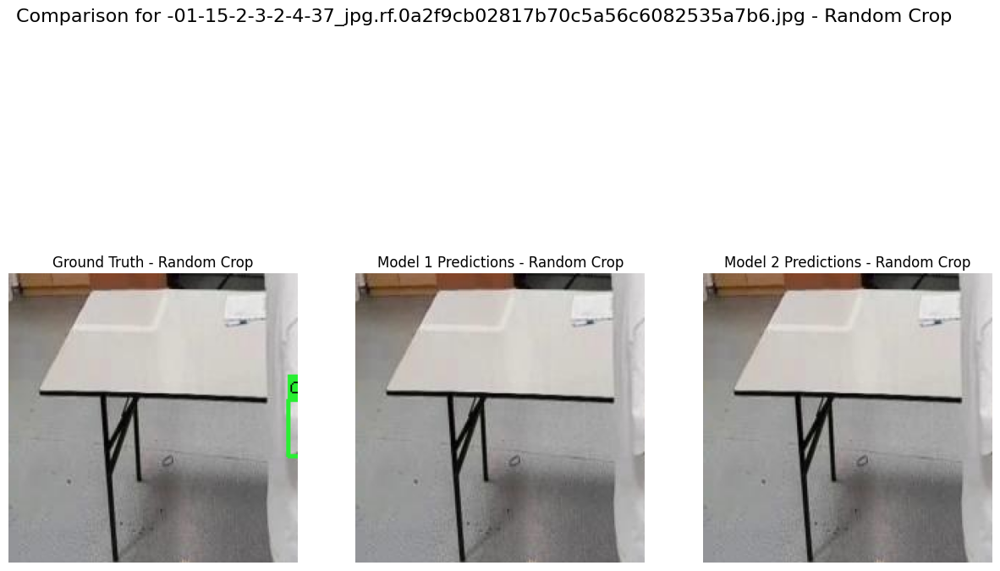

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


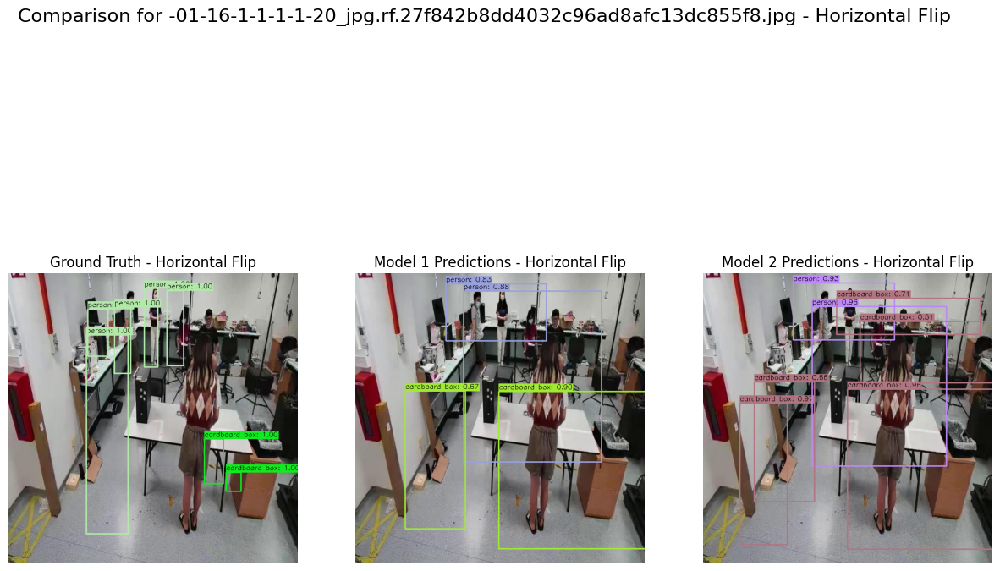

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


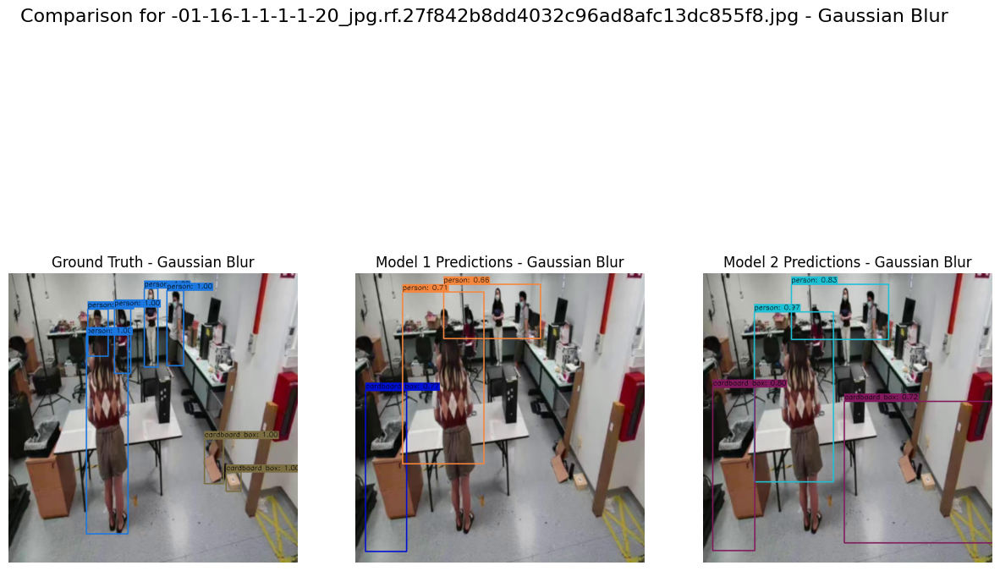

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


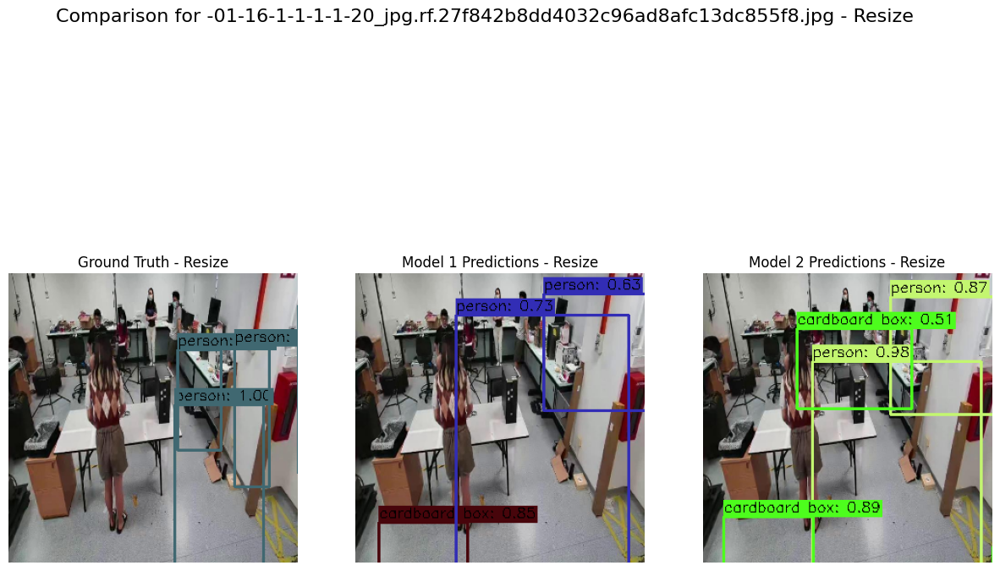

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


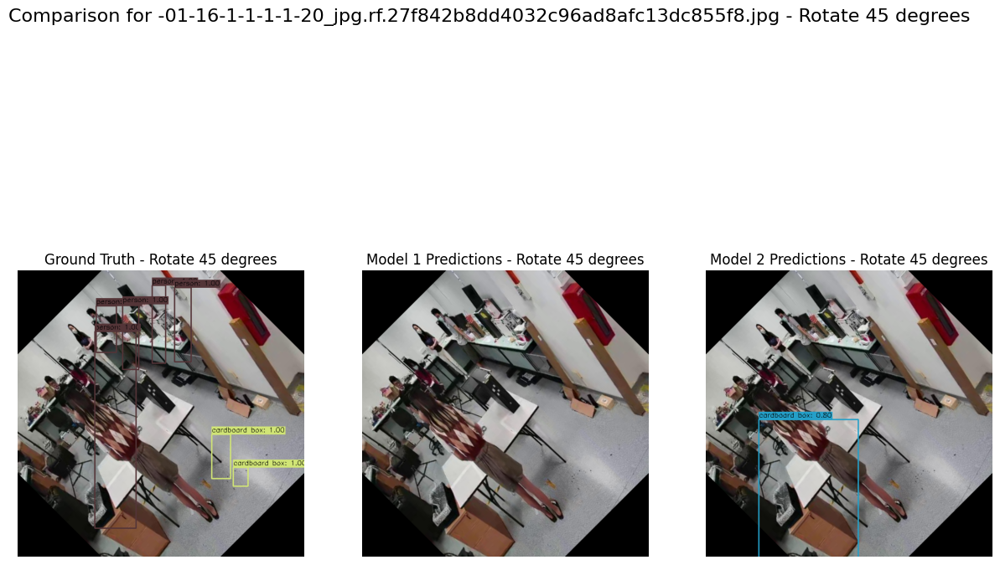

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


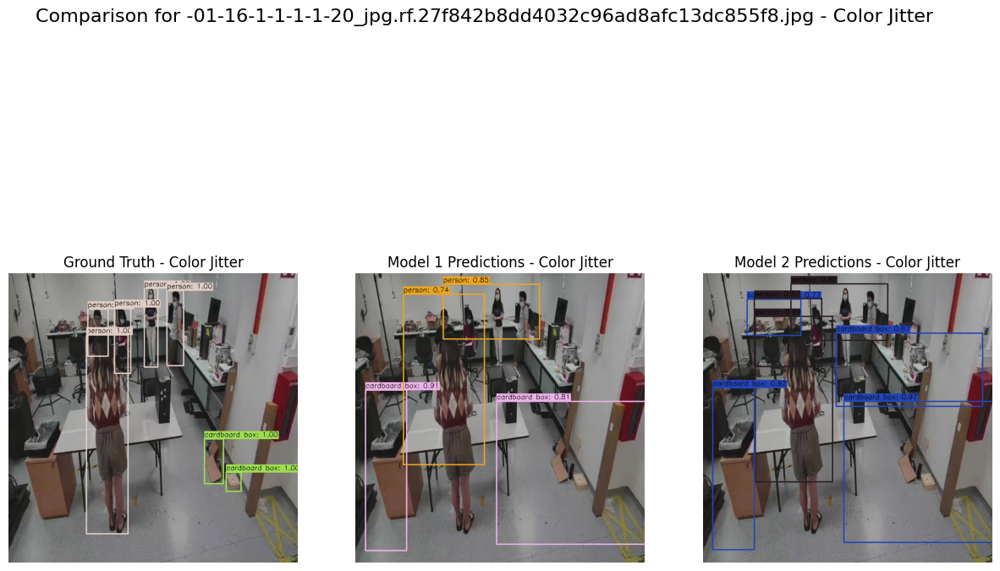

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


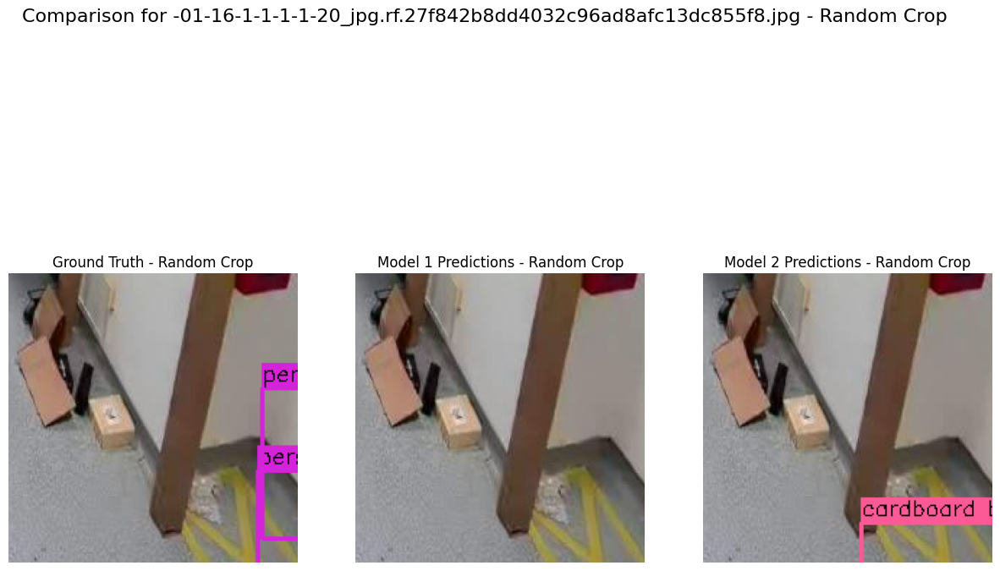

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


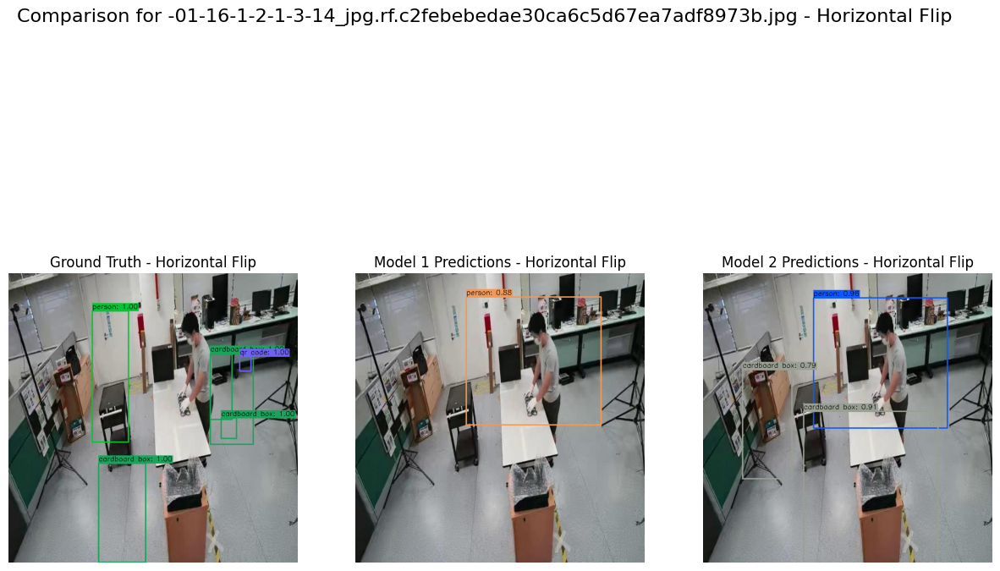

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


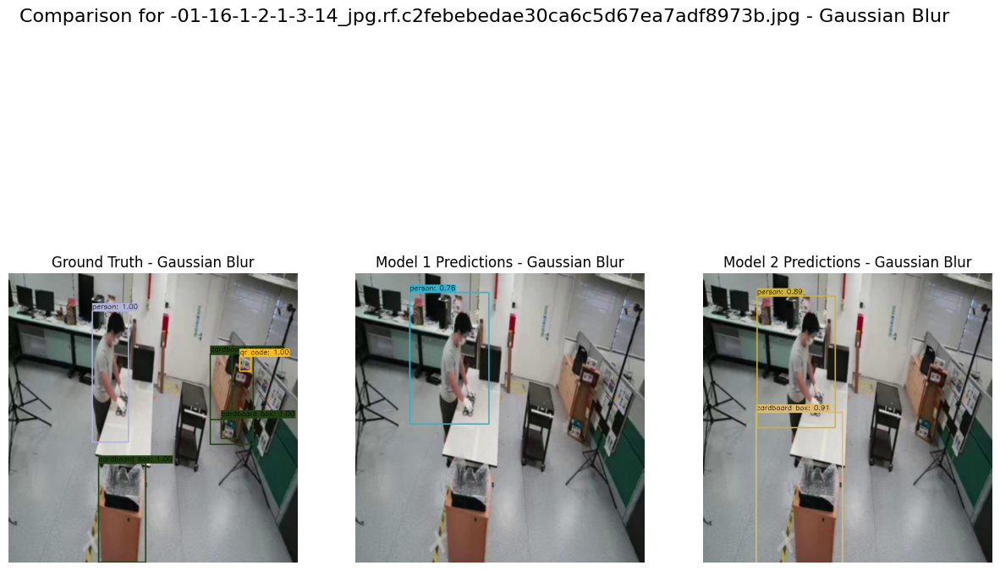

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


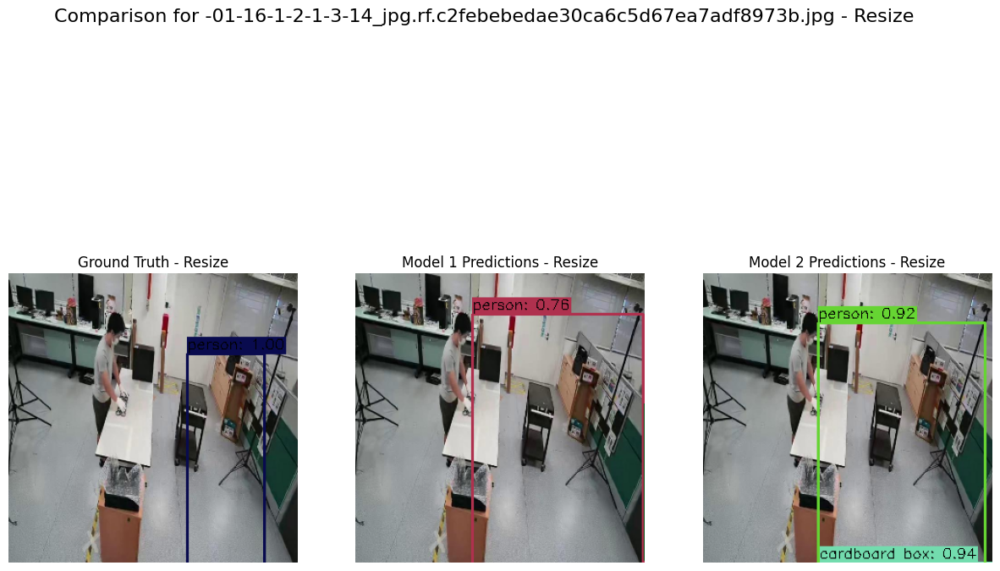

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


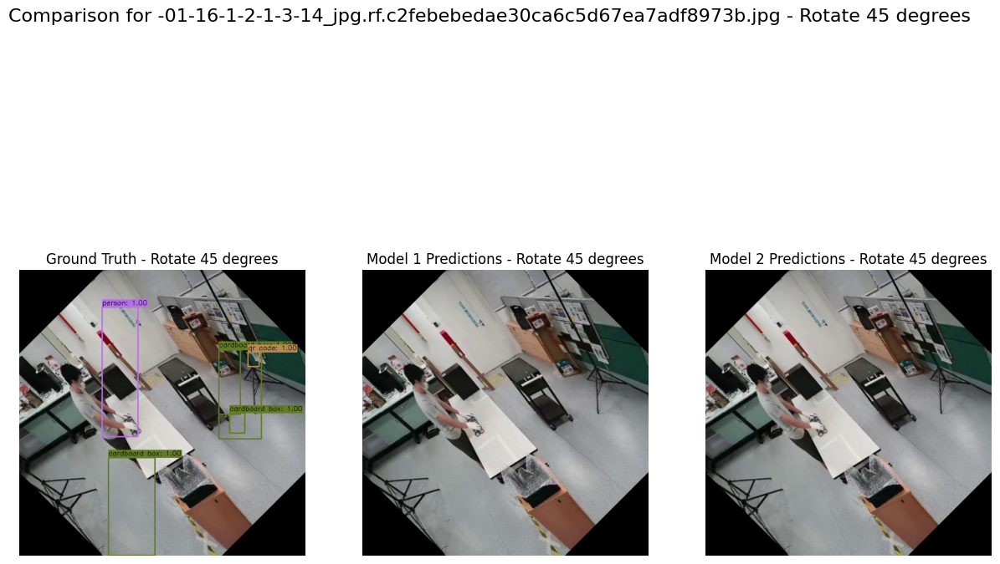

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


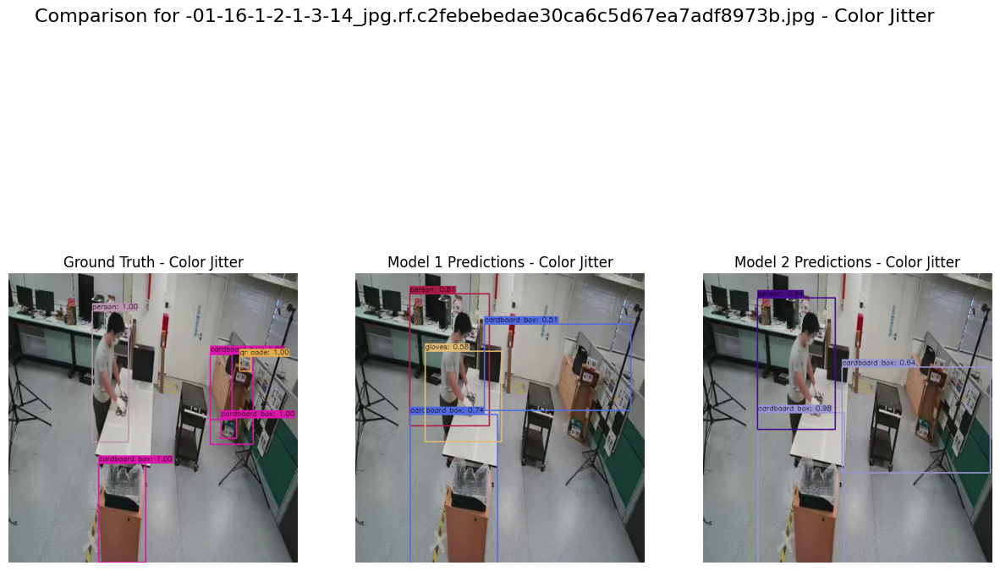

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


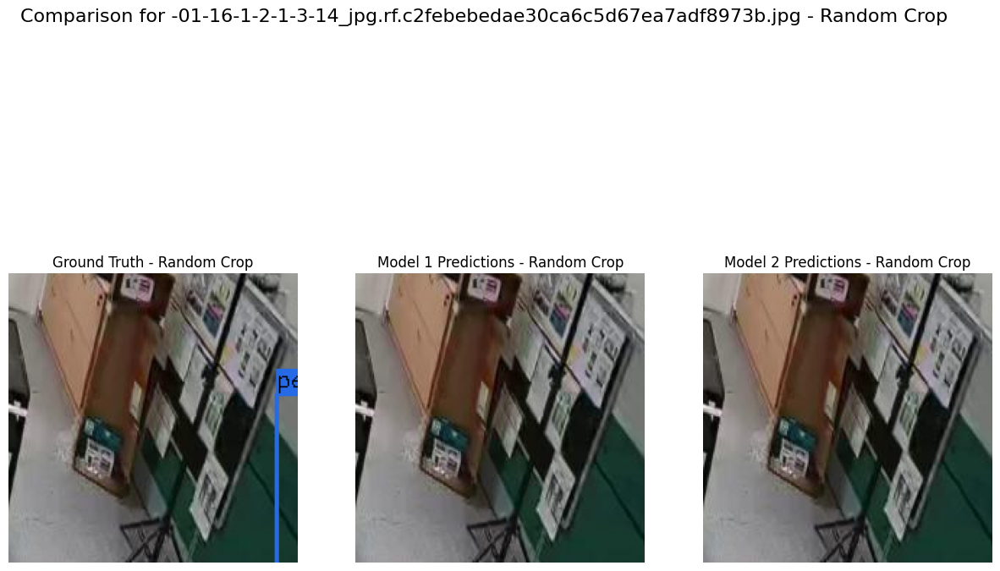

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


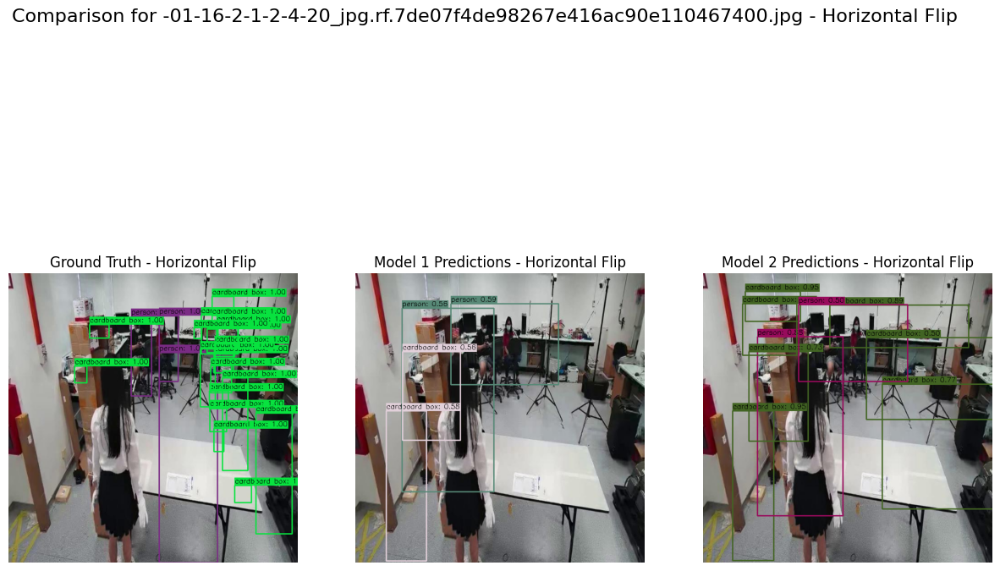

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


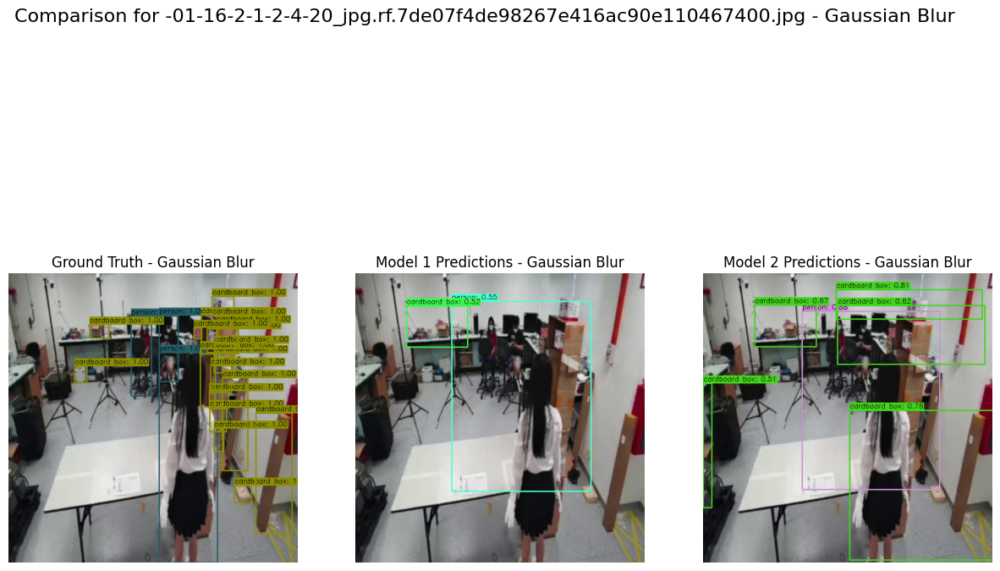

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


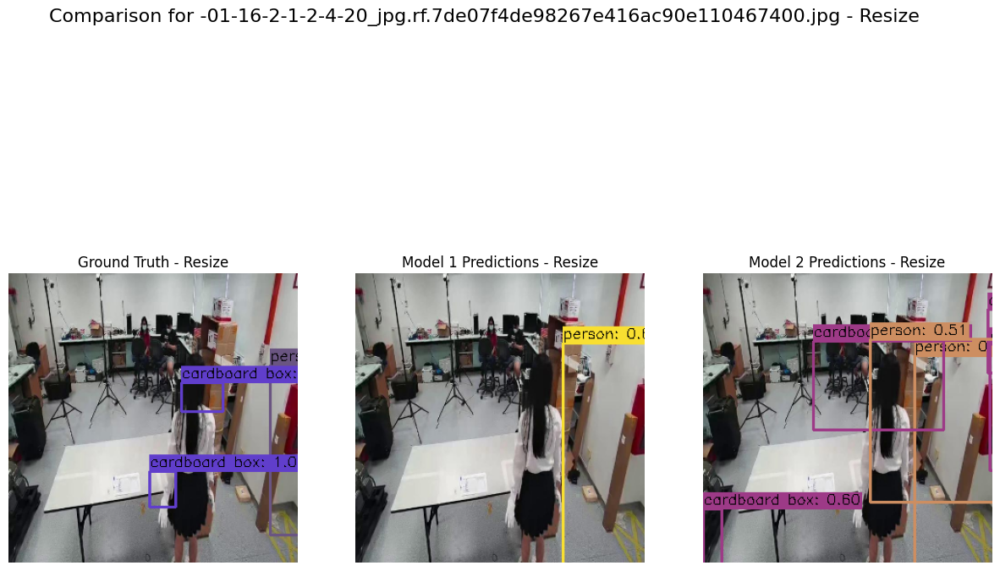

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


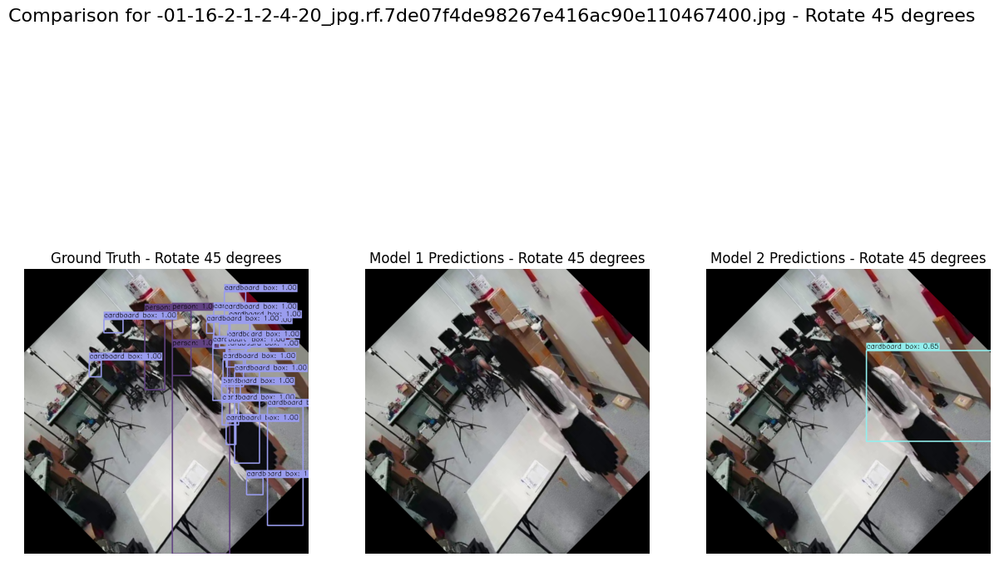

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


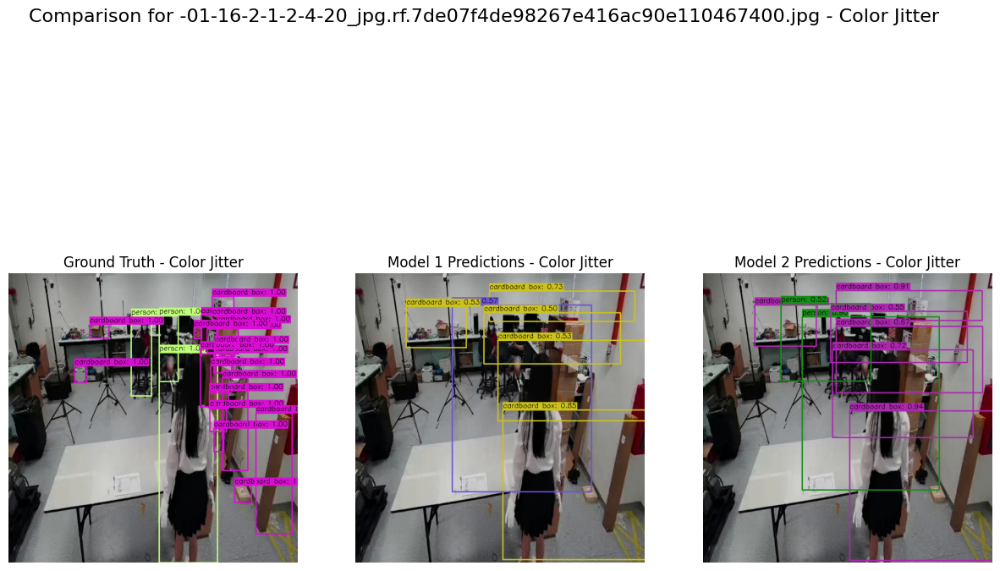

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


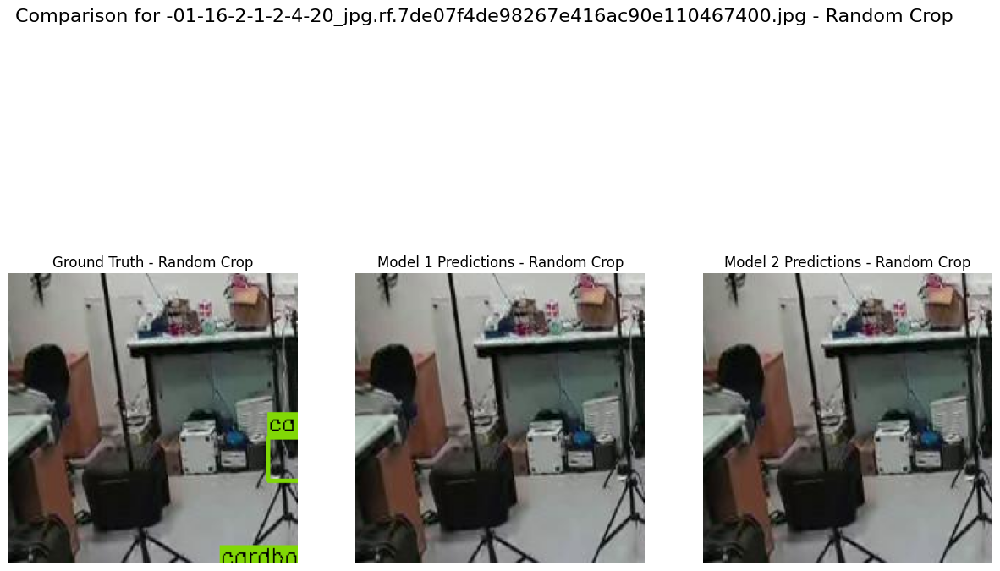

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


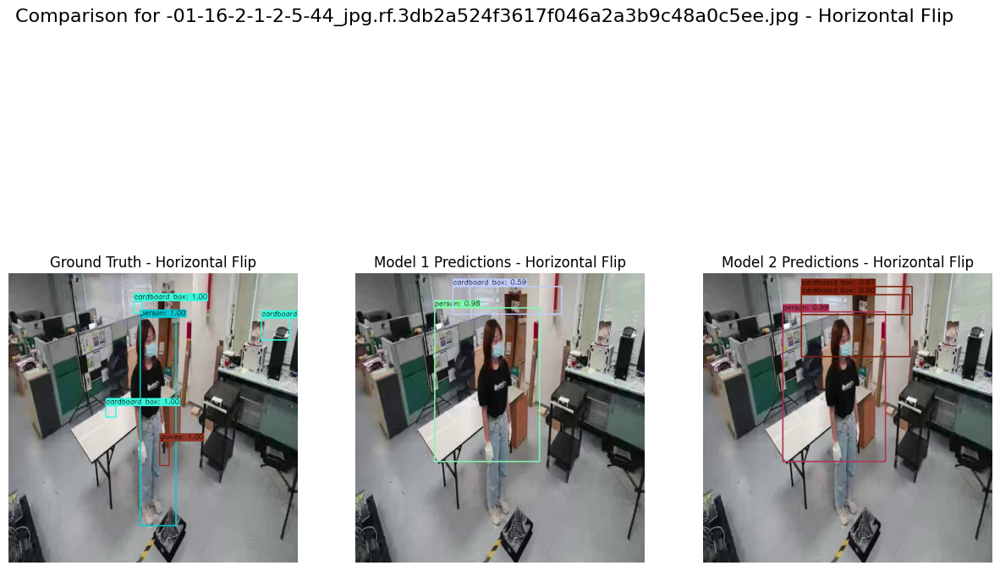

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


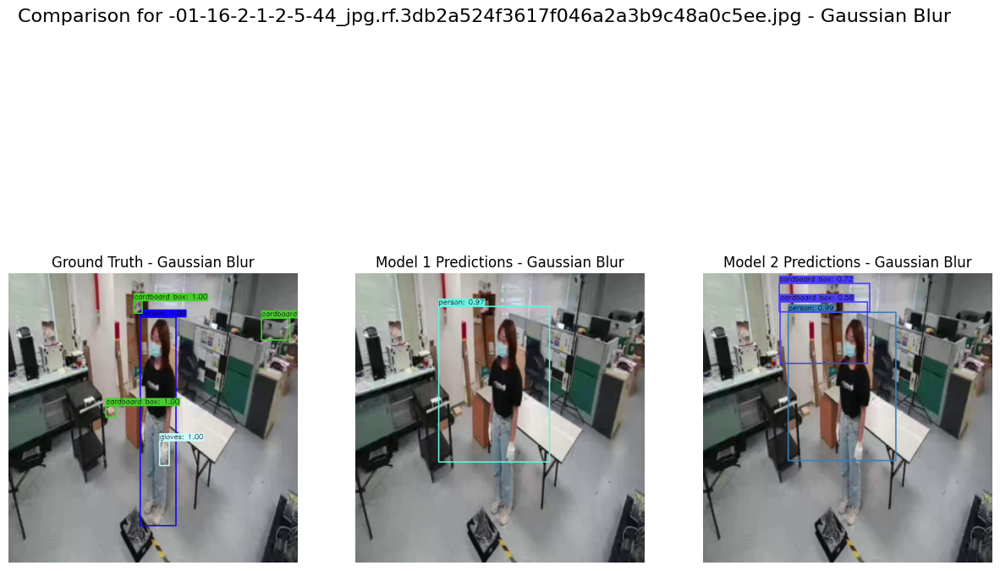

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


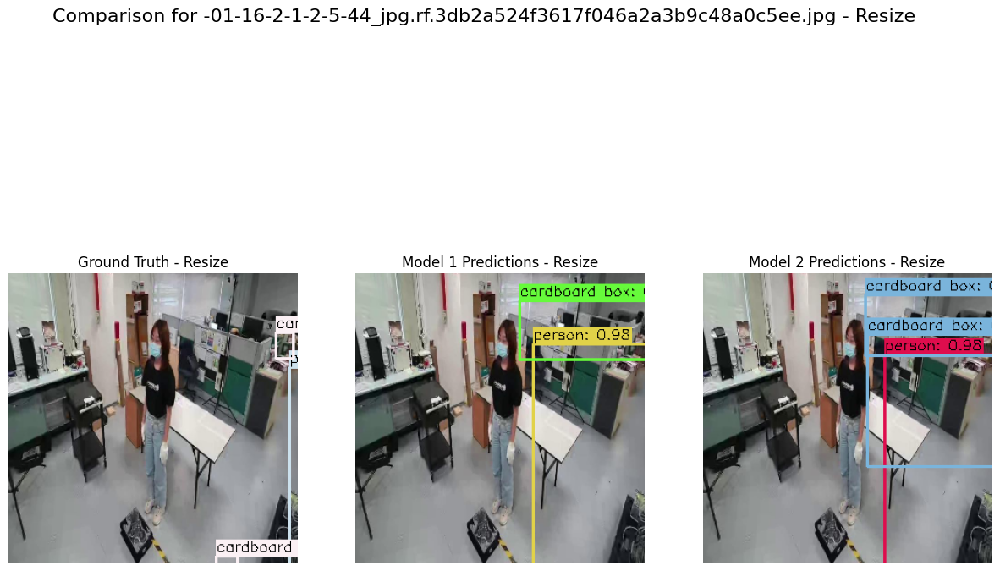

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


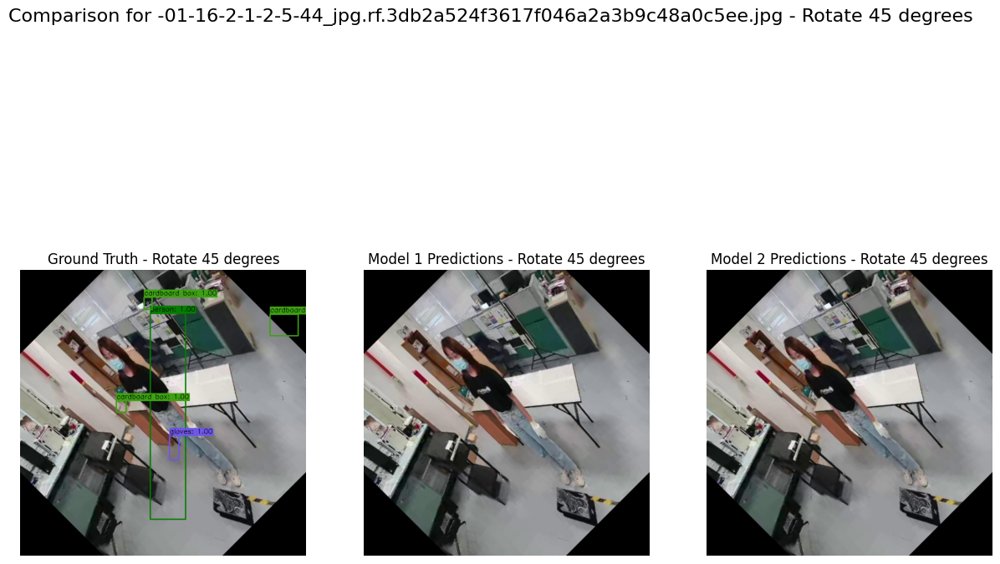

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


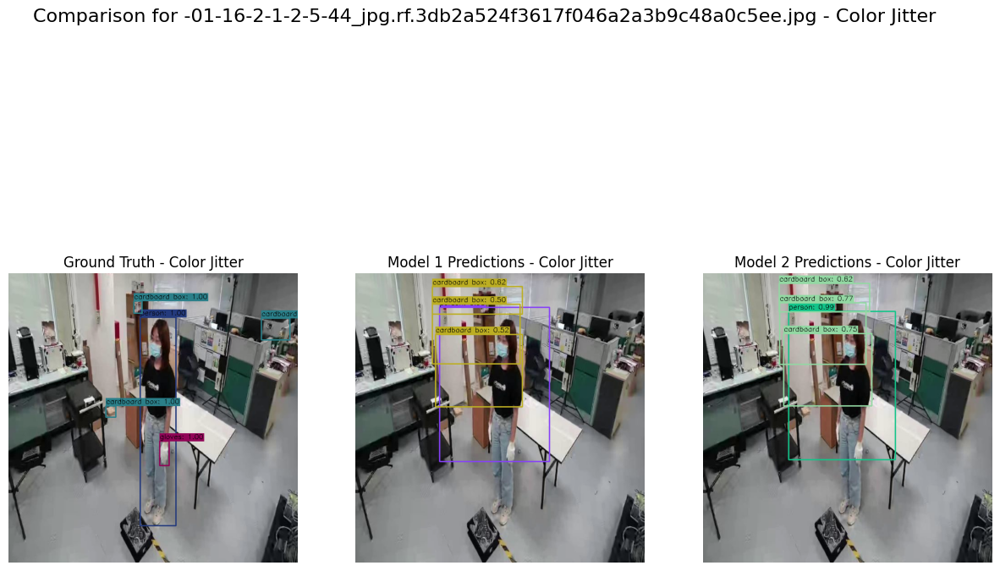

Inference time elapsed: 0.01 seconds
Inference time elapsed: 0.01 seconds


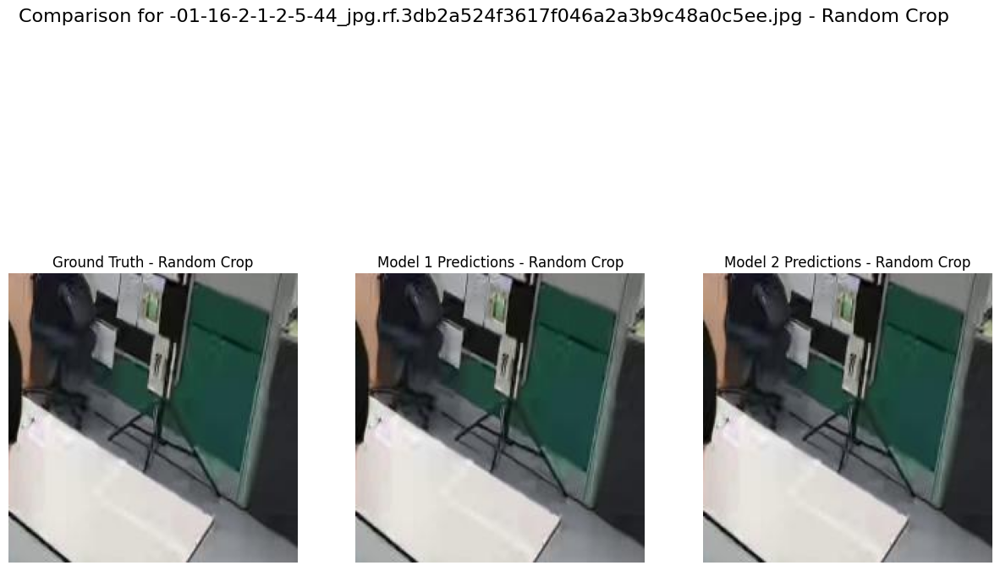

In [4]:
# Loop through the sampled images
for file_name in sampled_images:
    # Get base name without the extension
    base_name = os.path.splitext(file_name)[0]
    
    # Define corresponding text file path
    text_file = os.path.join(folder_path, f"{base_name}.txt")
    
    # Check if corresponding text file exists
    if os.path.exists(text_file):
        # Read the image
        image_path = os.path.join(folder_path, file_name)
        image = cv.imread(image_path)
        
        # Read ground truth data
        ground_truth = get_ground_truth(text_file)
        gt_bboxes = [bbox for _, bbox in ground_truth]
        gt_class_ids = [class_id for class_id, _ in ground_truth]
        
        # Loop through augmentations
        for aug_name, aug_func in augmentations:
            # Apply augmentation
            aug_image = aug_func(image.copy())
            
            # Perform Model 1 prediction and post-processing on augmented image
            m1_pp_frame, m1_og_frame = model1.preprocess(aug_image)
            m1_pred_bboxes, m1_pred_class_ids, m1_pred_scores = model1.predict(m1_pp_frame)
            m1_post_bboxes, m1_post_class_ids, m1_post_scores = model1.post_process(
                m1_pred_bboxes, m1_pred_class_ids, m1_pred_scores, m1_og_frame)
            m1_nms_bboxes, m1_nms_class_ids, m1_nms_labels, m1_nms_scores = filter(
                m1_post_bboxes, m1_post_class_ids, m1_post_scores, 0.5, 0.4)

            # Perform Model 2 prediction and post-processing on augmented image
            m2_pp_frame, m2_og_frame = model2.preprocess(aug_image)
            m2_pred_bboxes, m2_pred_class_ids, m2_pred_scores = model2.predict(m2_pp_frame)
            m2_post_bboxes, m2_post_class_ids, m2_post_scores = model2.post_process(
                m2_pred_bboxes, m2_pred_class_ids, m2_pred_scores, m2_og_frame)
            m2_nms_bboxes, m2_nms_class_ids, m2_nms_labels, m2_nms_scores = filter(
                m2_post_bboxes, m2_post_class_ids, m2_post_scores, 0.5, 0.4)
            
            # Calculate performance metrics for Model 1 on augmented image
            precision_m1, recall_m1, _, _, _ = calculate_pr(
                m1_nms_bboxes, m1_nms_class_ids, m1_nms_scores, gt_bboxes, gt_class_ids,
                num_classes=num_classes)
            ap_m1 = calculate_ap(precision_m1, recall_m1)
            aps_augmented_model1[aug_name].append(ap_m1)

            # Calculate performance metrics for Model 2 on augmented image
            precision_m2, recall_m2, _, _, _ = calculate_pr(
                m2_nms_bboxes, m2_nms_class_ids, m2_nms_scores, gt_bboxes, gt_class_ids,
                num_classes=num_classes)
            ap_m2 = calculate_ap(precision_m2, recall_m2)
            aps_augmented_model2[aug_name].append(ap_m2)

            # Visualize predictions for Model 1 and Model 2
            # Draw ground truth and predicted bounding boxes on image for comparison
            image_gt = aug_image.copy()
            image_gt = draw_bboxes(image_gt, gt_bboxes, gt_class_ids)
            
            # Draw predicted boxes for Model 1
            image_m1 = aug_image.copy()
            image_m1 = draw_bboxes(image_m1, m1_nms_bboxes, m1_nms_class_ids, m1_nms_scores)
            
            # Draw predicted boxes for Model 2
            image_m2 = aug_image.copy()
            image_m2 = draw_bboxes(image_m2, m2_nms_bboxes, m2_nms_class_ids, m2_nms_scores)
            
            # Display images side by side
            plt.figure(figsize=(15, 10))
            plt.subplot(1, 3, 1)
            plt.imshow(cv.cvtColor(image_gt, cv.COLOR_BGR2RGB))
            plt.title(f"Ground Truth - {aug_name}")
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(cv.cvtColor(image_m1, cv.COLOR_BGR2RGB))
            plt.title(f"Model 1 Predictions - {aug_name}")
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(cv.cvtColor(image_m2, cv.COLOR_BGR2RGB))
            plt.title(f"Model 2 Predictions - {aug_name}")
            plt.axis('off')

            plt.suptitle(f"Comparison for {file_name} - {aug_name}", fontsize=16)
            plt.show()
    else:
        print(f"No corresponding text file found for {file_name}")

### Analysis
The analysis of the impact of different augmentations on the performance of two object detection models reveals some interesting insights into their robustness and limitations. The following augmentations were applied to one of the analyzed images: Horizontal Flip, Gaussian Blur, Resize, Rotate 45 Degrees, Color Jitter, and Random Crop. Each augmentation was evaluated for its influence on the performance of two models (Model 1 and Model 2), specifically by visualizing how the models handled the transformations.

#### Horizontal Flip
In the visual results for one of the analyzed images, it was observed that Model 1 detected only the person with a confidence score of 0.91, while other objects like the "cardboard box" were entirely missed. In contrast, Model 2 performed better, detecting both the person and the cardboard box, with confidence scores of 0.91 and 0.71, respectively. However, both models showed difficulty in maintaining accuracy with horizontally flipped images, highlighting a lack of robustness to mirrored orientations.

#### Gaussian Blur
The visual results show that both models struggled when Gaussian Blur was applied to the image. Model 1 did not detect any objects, while Model 2 detected the person with a confidence score of 0.75. Both models completely missed other key objects such as the "cardboard box." This suggests that both models rely heavily on sharp features, which were obscured by the blurring, making it difficult for them to correctly detect objects.

#### Resize
When the analyzed image was resized, both models struggled to accurately detect objects. Model 1 did not detect any objects, while Model 2 detected only the person with a confidence score of 0.84. Both models missed detecting smaller objects like the "cardboard box." This indicates that both models lack adequate scale invariance, suggesting they were not sufficiently trained on diverse object scales, limiting their ability to detect objects at varying sizes.

#### Rotate 45 Degrees
The visual inspection showed that neither model was able to detect objects effectively after rotation. Model 1 and Model 2 both failed to localize the "cardboard box" and the "person." This points to the models' lack of rotational invariance, a critical issue when detecting objects from different angles. The inability to adapt to rotated images suggests that the models were overly reliant on the original orientation of objects in the training data.

#### Color Jitter
The visual results showed that Model 1 was able to detect the person with a confidence score of 0.62 and the cardboard box with a confidence score of 0.55. Model 2 detected the person and the cardboard box, but the confidence scores were lower compared to the original image. Both models showed inconsistencies in the bounding box placements, indicating that changes in lighting conditions had a significant impact on their ability to accurately detect and classify objects. This suggests an over-reliance on color features for object detection, which, when altered, led to confusion in classification and localization.

#### Random Crop
The visual results showed that both models performed poorly on the randomly cropped image. Model 1 detected the person with a confidence score of 0.55, while Model 2 failed to detect any objects. The partial visibility of objects, such as the "person," made it challenging for the models to correctly classify and localize them. This highlights the models' struggle to recognize objects that were only partially visible or when the image context was significantly altered due to cropping.

### Conclusion
The overall results demonstrate that both models lacked robustness to a variety of common augmentations when tested on one of the analyzed images. The visualizations highlighted the specific limitations of each augmentation: objects were either missed or incorrectly localized, and the models failed to adapt to changes in orientation, focus, scale, color, and partial visibility. This lack of adaptability suggests that the models are overfitting to the specific characteristics of the training dataset and failing to generalize to variations commonly encountered in real-world environments. For improved performance, it would be necessary to incorporate more diverse training data, including augmented images, to help the models learn invariances to these transformations. Additionally, techniques such as fine-tuning with augmented datasets or employing data augmentation during training could improve the robustness of these models to such transformations.